In [29]:
import pandas as pd
# df = pd.read_parquet('green_tripdata_2024-01.parquet', engine='pyarrow')
df = pd.read_parquet('yellow_tripdata_2023-01.parquet', engine='pyarrow')

# # print(df[df['PULocationID']==4 or df['DOLocationID']==4])
# df['passenger_count'] = df['passenger_count'].fillna(0.0)
# df = df.loc[(df['fare_amount'] > 0) & (df['passenger_count'] > 0)]

In [33]:
import pandas as pd
df = pd.read_parquet('yellow_tripdata_2023-01.parquet', engine='pyarrow')
df = df.loc[:, df.columns.intersection(['tpep_pickup_datetime','tpep_dropoff_datetime','passenger_count','PULocationID','DOLocationID','lpep_pickup_datetime','lpep_dropoff_datetime'])]


3066766
Total passenger count: 4080815.0


In [35]:
(4080815.0/3066766) * 76

101.12996557285427

In [285]:
result = pd.merge(df, taxi_zone, left_on='PULocationID', right_on='location_id', how='left')
result = result.drop(columns=['shape_area','zone','borough','geometry','objectid','shape_leng','location_id'])
result = result.rename(columns={'centroid': 'PULocationCentroid'})

result = pd.merge(result, taxi_zone, left_on='DOLocationID', right_on='location_id', how='left')
result = result.drop(columns=['shape_area','zone','borough','geometry','objectid','shape_leng','location_id'])
result = result.rename(columns={'centroid': 'DOLocationCentroid'})

result

,lpep_pickup_datetime,lpep_dropoff_datetime,PULocationID,DOLocationID,passenger_count,PULocationCentroid,DOLocationCentroid
0,2024-01-01 00:46:55,2024-01-01 00:58:25,236,239,1.0,POINT (-73.95701 40.78044),POINT (-73.97863 40.78396)
1,2024-01-01 00:31:42,2024-01-01 00:52:34,65,170,5.0,POINT (-73.98609 40.69534),POINT (-73.97849 40.74775)
2,2024-01-01 00:30:21,2024-01-01 00:49:23,74,262,1.0,POINT (-73.93735 40.80117),POINT (-73.94651 40.77593)
3,2024-01-01 00:30:20,2024-01-01 00:42:12,74,116,1.0,POINT (-73.93735 40.80117),POINT (-73.94852 40.82701)
4,2024-01-01 00:32:38,2024-01-01 00:43:37,74,243,1.0,POINT (-73.93735 40.80117),POINT (-73.93283 40.85711)
...,...,...,...,...,...,...,...
56940,2024-01-31 20:46:00,2024-01-31 20:55:00,33,25,NaN,POINT (-73.99525 40.69580),POINT (-73.98611 40.68563)
56941,2024-01-31 21:06:00,2024-01-31 21:11:00,72,72,NaN,POINT (-73.92225 40.65236),POINT (-73.92225 40.65236)
56942,2024-01-31 21:36:00,2024-01-31 21:40:00,72,72,NaN,POINT (-73.92225 40.65236),POINT (-73.92225 40.65236)
56943,2024-01-31 22:45:00,2024-01-31 22:51:00,41,42,NaN,POINT (-73.95129 40.80433),POINT (-73.94077 40.81826)


In [35]:
taxi_zone.info()

taxi_zone['location_id'] = pd.to_numeric(taxi_zone['location_id'], errors='coerce')

# Convert the column to int32
taxi_zone['location_id'] = taxi_zone['location_id'].astype('int32')
taxi_zone.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 263 entries, 0 to 262
Data columns (total 8 columns):
 #   Column       Non-Null Count  Dtype   
---  ------       --------------  -----   
 0   shape_area   263 non-null    object  
 1   objectid     263 non-null    object  
 2   shape_leng   263 non-null    object  
 3   location_id  263 non-null    object  
 4   zone         263 non-null    object  
 5   borough      263 non-null    object  
 6   geometry     263 non-null    geometry
 7   centroid     263 non-null    geometry
dtypes: geometry(2), object(6)
memory usage: 16.6+ KB
<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 263 entries, 0 to 262
Data columns (total 8 columns):
 #   Column       Non-Null Count  Dtype   
---  ------       --------------  -----   
 0   shape_area   263 non-null    object  
 1   objectid     263 non-null    object  
 2   shape_leng   263 non-null    object  
 3   location_id  263 non-null    int32   
 4   zone         263 non-null    

In [25]:
result = df.groupby('PULocationID').size().reset_index(name='Pick Ups')

In [22]:
result

,PULocationID,Pick Ups
0,1,410
1,2,2
2,3,39
3,4,3649
4,5,56
...,...,...
252,261,12842
253,262,43760
254,263,66128
255,264,40116


In [26]:
result1 = df.groupby('DOLocationID').size().reset_index(name='Drop Offs')

In [20]:
result1

,DOLocationID,Drop Offs
0,1,7526
1,2,23
2,3,198
3,4,12165
4,5,56
...,...,...
256,261,12427
257,262,51502
258,263,69319
259,264,22591


In [27]:
result2 = pd.merge(result, result1, left_on='PULocationID', right_on='DOLocationID', how='inner')

In [28]:
result2 = result2.drop(['DOLocationID'], axis=1)

In [29]:
result2 = result2.rename(columns={"PULocationID": "Location ID"})

In [30]:
result2

,Location ID,Pick Ups,Drop Offs
0,1,410,7526
1,2,2,23
2,3,39,198
3,4,3649,12165
4,5,56,56
...,...,...,...
251,261,12842,12427
252,262,43760,51502
253,263,66128,69319
254,264,40116,22591


In [31]:
asd = df[(df['PULocationID'] == 4)].copy()
# asd[['tpep_pickup_datetime','passenger_count']]
asd['passenger_count'] = asd['passenger_count'].fillna(1)
asd[['tpep_pickup_datetime','passenger_count']]
asd[asd['passenger_count']>0][['tpep_pickup_datetime','passenger_count']]


,tpep_pickup_datetime,passenger_count
157,2023-01-01 00:27:02,1.0
735,2023-01-01 00:39:27,1.0
971,2023-01-01 00:12:02,1.0
1233,2023-01-01 00:25:22,1.0
1444,2023-01-01 00:31:01,1.0
...,...,...
3066186,2023-01-31 18:20:31,1.0
3066603,2023-01-31 22:44:51,1.0
3066625,2023-01-31 22:56:00,1.0
3066700,2023-01-31 22:31:52,1.0


In [32]:
asdD = df[(df['DOLocationID'] == 4)].copy()
# asd[['tpep_pickup_datetime','passenger_count']]
asdD['passenger_count'] = asdD['passenger_count'].fillna(1)
asdD[asdD['passenger_count']>0][['tpep_dropoff_datetime','passenger_count']]
asdD['passenger_count'] = -asdD['passenger_count']

In [33]:
asdD

,VendorID,tpep_pickup_datetime,tpep_dropoff_datetime,passenger_count,trip_distance,RatecodeID,store_and_fwd_flag,PULocationID,DOLocationID,payment_type,fare_amount,extra,mta_tax,tip_amount,tolls_amount,improvement_surcharge,total_amount,congestion_surcharge,airport_fee
43,2,2023-01-01 00:21:29,2023-01-01 00:25:11,-1.0,0.61,1.0,N,79,4,1,5.80,1.0,0.5,2.16,0.0,1.0,12.96,2.5,0.0
156,2,2023-01-01 00:18:08,2023-01-01 00:25:07,-1.0,0.90,1.0,N,79,4,1,7.90,1.0,0.5,2.58,0.0,1.0,15.48,2.5,0.0
387,2,2023-01-01 00:24:48,2023-01-01 00:56:28,-2.0,4.17,1.0,N,246,4,1,29.60,1.0,0.5,6.00,0.0,1.0,40.60,2.5,0.0
507,2,2023-01-01 00:37:27,2023-01-01 00:51:14,-1.0,1.98,1.0,N,234,4,1,14.20,1.0,0.5,4.80,0.0,1.0,24.00,2.5,0.0
519,2,2023-01-01 00:04:28,2023-01-01 00:09:49,-2.0,0.69,1.0,N,79,4,1,6.50,1.0,0.5,0.00,0.0,1.0,11.50,2.5,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3065667,1,2023-01-31 13:16:39,2023-01-31 13:29:10,-1.0,0.00,NaN,None,125,4,0,7.26,0.0,0.5,0.00,0.0,1.0,11.26,NaN,NaN
3066012,2,2023-01-31 16:13:00,2023-01-31 16:38:00,-1.0,2.82,NaN,None,233,4,0,16.70,0.0,0.5,6.21,0.0,1.0,26.91,NaN,NaN
3066400,2,2023-01-31 20:10:43,2023-01-31 20:20:56,-1.0,3.94,NaN,None,140,4,0,16.02,0.0,0.5,4.00,0.0,1.0,24.02,NaN,NaN
3066717,2,2023-01-31 23:45:12,2023-01-31 23:55:49,-1.0,1.30,NaN,None,211,4,0,15.21,0.0,0.5,3.84,0.0,1.0,23.05,NaN,NaN


In [34]:
asd = pd.concat([asd, asdD], ignore_index=True)

In [35]:
asd = asd.sort_values('tpep_pickup_datetime')

In [36]:
asd[['tpep_pickup_datetime','passenger_count']]

,tpep_pickup_datetime,passenger_count
3653,2023-01-01 00:04:28,-2.0
3660,2023-01-01 00:07:15,-1.0
3665,2023-01-01 00:07:44,-1.0
2,2023-01-01 00:12:02,1.0
15468,2023-01-01 00:15:00,-1.0
...,...,...
15452,2023-01-31 23:46:34,-1.0
3113,2023-01-31 23:47:23,1.0
15461,2023-01-31 23:55:58,-1.0
3112,2023-01-31 23:58:59,3.0


In [37]:
asd['Cumulative_Sum'] = asd['passenger_count'].cumsum()

In [38]:
asd[['tpep_pickup_datetime','passenger_count','Cumulative_Sum']]

,tpep_pickup_datetime,passenger_count,Cumulative_Sum
3653,2023-01-01 00:04:28,-2.0,-2.0
3660,2023-01-01 00:07:15,-1.0,-3.0
3665,2023-01-01 00:07:44,-1.0,-4.0
2,2023-01-01 00:12:02,1.0,-3.0
15468,2023-01-01 00:15:00,-1.0,-4.0
...,...,...,...
15452,2023-01-31 23:46:34,-1.0,-11270.0
3113,2023-01-31 23:47:23,1.0,-11269.0
15461,2023-01-31 23:55:58,-1.0,-11270.0
3112,2023-01-31 23:58:59,3.0,-11267.0


In [2]:
import matplotlib.pyplot as plt


# df = pd.DataFrame(data)

# Plot a line chart
asd.plot(x='tpep_pickup_datetime', y='Cumulative_Sum', kind='line')

# Add labels and title
plt.xlabel('X-axis')
plt.ylabel('Y-axis')
plt.title('Line Chart')

# Show the plot
plt.show()

NameError: name 'asd' is not defined

In [42]:
def plot(i):    
    asd = df[(df['PULocationID'] == i)].copy()
    # asd[['tpep_pickup_datetime','passenger_count']]
    asd['passenger_count'] = asd['passenger_count'].fillna(1)
    asd[['tpep_pickup_datetime','passenger_count']]
    asd[asd['passenger_count']>0][['tpep_pickup_datetime','passenger_count']]

    asdD = df[(df['DOLocationID'] == i)].copy()
    # asd[['tpep_pickup_datetime','passenger_count']]
    asdD['passenger_count'] = asdD['passenger_count'].fillna(1)
    asdD[asdD['passenger_count']>0][['tpep_dropoff_datetime','passenger_count']]
    asdD['passenger_count'] = -asdD['passenger_count']

    asd = pd.concat([asd, asdD], ignore_index=True)
    asd = asd.sort_values('tpep_pickup_datetime')
    asd['Cumulative_Sum'] = asd['passenger_count'].cumsum()
    return asd
#     asd.plot(x='tpep_pickup_datetime', y='Cumulative_Sum', kind='line')
    
#     # Add labels and title
#     plt.xlabel('X-axis')
#     plt.ylabel('Y-axis')
#     plt.title('Line Chart'+str(i))

#     # Show the plot
#     plt.show()

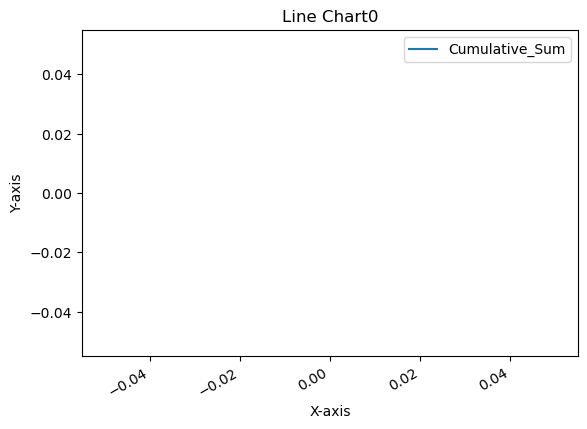

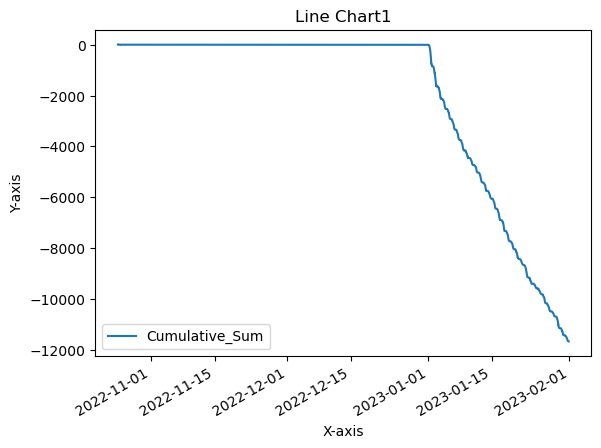

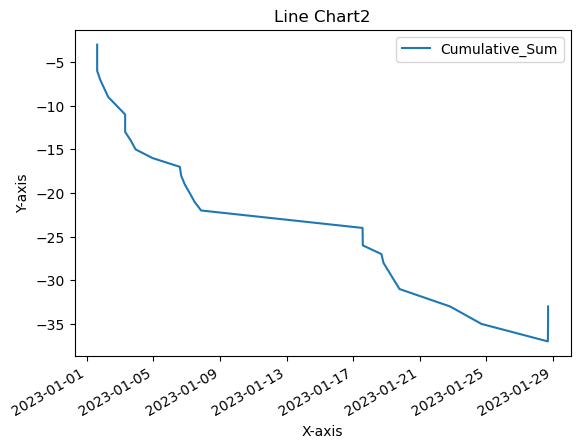

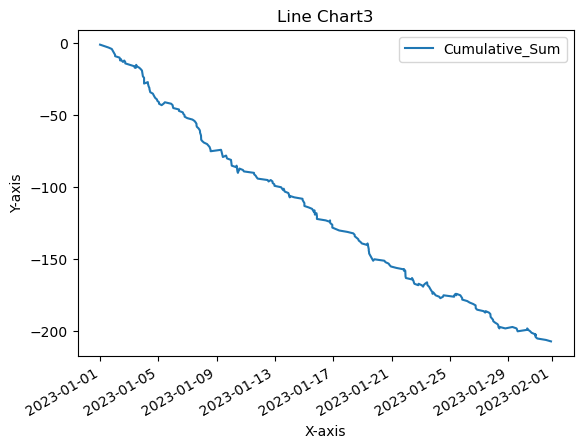

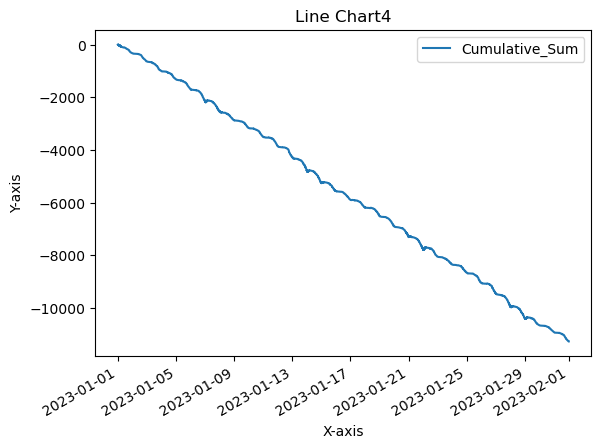

...

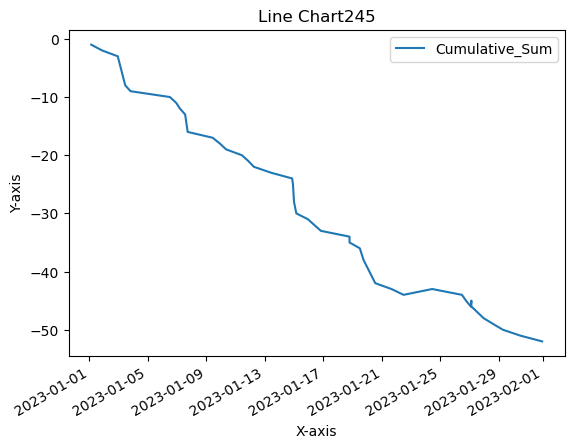

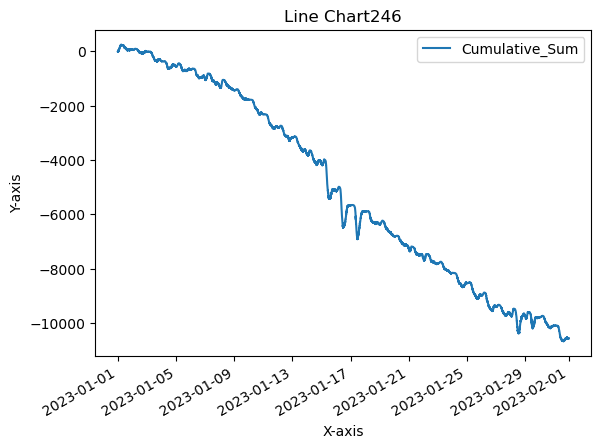

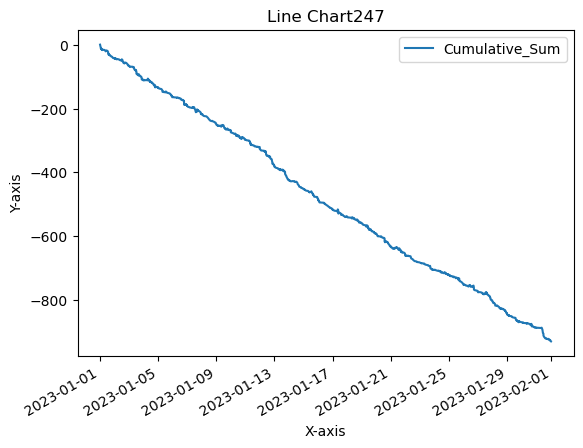

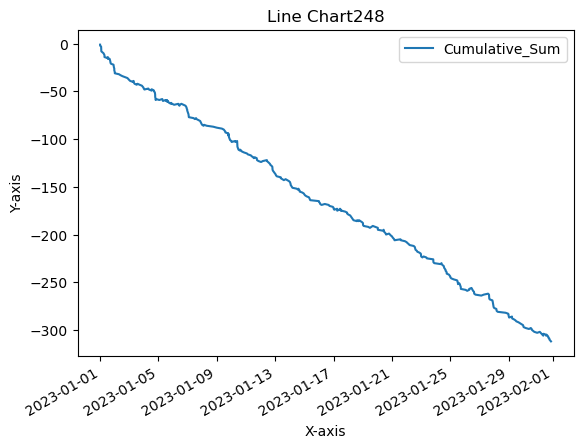

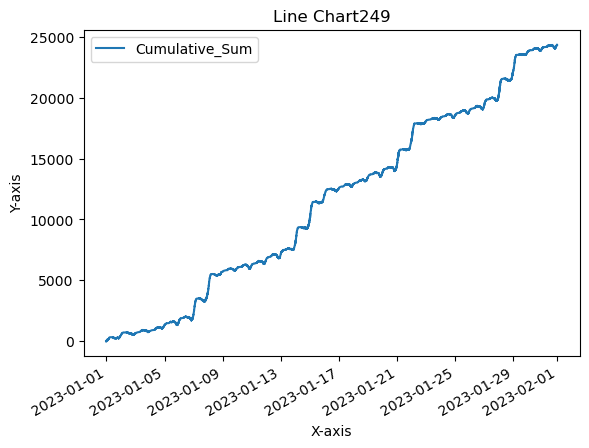

In [115]:
for i in range(250):
    plot(i)

In [43]:
t = plot(140)['tpep_pickup_datetime']
s = plot(140)['tpep_pickup_datetime']

,VendorID,tpep_pickup_datetime,tpep_dropoff_datetime,passenger_count,trip_distance,RatecodeID,store_and_fwd_flag,PULocationID,DOLocationID,payment_type,fare_amount,extra,mta_tax,tip_amount,tolls_amount,improvement_surcharge,total_amount,congestion_surcharge,airport_fee,Cumulative_Sum
67278,2,2022-12-31 23:45:10,2023-01-01 00:04:26,-1.0,3.76,1.0,N,249,140,1,20.5,1.0,0.5,10.00,0.00,1.0,35.50,2.5,0.0,-1.0
67116,2,2022-12-31 23:51:30,2022-12-31 23:56:06,-1.0,0.86,1.0,N,141,140,1,6.5,1.0,0.5,2.00,0.00,1.0,13.50,2.5,0.0,-2.0
50,2,2022-12-31 23:59:48,2023-01-01 00:00:47,1.0,0.38,1.0,N,140,141,1,3.7,1.0,0.5,1.74,0.00,1.0,10.44,2.5,0.0,-1.0
67117,2,2023-01-01 00:02:19,2023-01-01 00:30:49,-1.0,20.37,2.0,N,132,140,1,70.0,0.0,0.5,12.00,6.55,1.0,92.55,2.5,0.0,-2.0
67114,2,2023-01-01 00:03:52,2023-01-01 00:18:27,-1.0,5.01,1.0,N,144,140,1,23.3,1.0,0.5,5.66,0.00,1.0,33.96,2.5,0.0,-3.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
132025,2,2023-01-31 23:54:29,2023-02-01 00:00:13,-3.0,1.23,1.0,N,229,140,1,8.6,1.0,0.5,1.00,0.00,1.0,14.60,2.5,0.0,-26.0
132046,1,2023-01-31 23:55:13,2023-02-01 00:04:41,-1.0,2.90,1.0,N,79,140,1,13.5,3.5,0.5,1.50,0.00,1.0,20.00,2.5,0.0,-27.0
132048,2,2023-01-31 23:55:16,2023-02-01 00:10:34,-1.0,3.22,1.0,N,164,140,1,17.7,1.0,0.5,4.54,0.00,1.0,27.24,2.5,0.0,-28.0
67113,1,2023-01-31 23:58:58,2023-02-01 00:10:25,1.0,1.80,NaN,None,140,48,0,11.4,1.0,0.5,2.46,0.00,1.0,18.86,NaN,NaN,-27.0


In [3]:
import numpy as np  
import matplotlib.pyplot as plt 
import pandas as pd
from scipy.fft import fftfreq 

t = data["time"].loc[data["time"] > 5].loc[data["time"] < 10]
s = data["y_value"].loc[data["time"] > 5].loc[data["time"] < 10]

fft = np.fft.fft(s)
fft[0] = 0
fftfreq = np.fft.fftfreq(len(s))*len(s)/(t.max()-t.min())

plt.subplot(1, 2, 1)
plt.xlabel("Frquency Domain")
plt.ylabel("Amplitude")
plt.plot(fftfreq, fft)
plt.subplot(1, 2, 2)
plt.plot(t, s)
plt.show()

NameError: name 'data' is not defined

,shape_area,objectid,shape_leng,location_id,zone,borough,geometry
0,0.0007823067885,1,0.116357453189,1,Newark Airport,EWR,"MULTIPOLYGON (((-74.18445 40.69500, -74.18449 ..."
1,0.00486634037837,2,0.43346966679,2,Jamaica Bay,Queens,"MULTIPOLYGON (((-73.82338 40.63899, -73.82277 ..."
2,0.000314414156821,3,0.0843411059012,3,Allerton/Pelham Gardens,Bronx,"MULTIPOLYGON (((-73.84793 40.87134, -73.84725 ..."
3,0.000111871946192,4,0.0435665270921,4,Alphabet City,Manhattan,"MULTIPOLYGON (((-73.97177 40.72582, -73.97179 ..."
4,0.000497957489363,5,0.0921464898574,5,Arden Heights,Staten Island,"MULTIPOLYGON (((-74.17422 40.56257, -74.17349 ..."


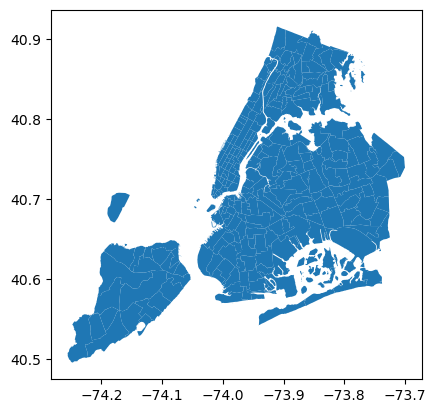

In [1]:
import geopandas as gpd
taxi_zone = gpd.read_file('NYCTaxiZones.geojson')

taxi_zone.plot()

taxi_zone.head()

In [32]:

from shapely.geometry import MultiPolygon

# # Assuming your data is in a CSV file
# csv_file = "your_data.csv"

# # Read the CSV file into a GeoDataFrame
# gdf = gpd.read_file(csv_file)

taxi_zone = gpd.read_file('NYCTaxiZones.geojson')

# Ensure the geometry column is set as geometries
taxi_zone.set_geometry("geometry", inplace=True)

# Calculate the centroid of the MultiPolygon
taxi_zone['centroid'] = taxi_zone['geometry'].centroid

# Print the GeoDataFrame with centroids
taxi_zone

,shape_area,objectid,shape_leng,location_id,zone,borough,geometry,centroid
0,0.0007823067885,1,0.116357453189,1,Newark Airport,EWR,"MULTIPOLYGON (((-74.18445 40.69500, -74.18449 ...",POINT (-74.17400 40.69183)
1,0.00486634037837,2,0.43346966679,2,Jamaica Bay,Queens,"MULTIPOLYGON (((-73.82338 40.63899, -73.82277 ...",POINT (-73.83130 40.61675)
2,0.000314414156821,3,0.0843411059012,3,Allerton/Pelham Gardens,Bronx,"MULTIPOLYGON (((-73.84793 40.87134, -73.84725 ...",POINT (-73.84742 40.86447)
3,0.000111871946192,4,0.0435665270921,4,Alphabet City,Manhattan,"MULTIPOLYGON (((-73.97177 40.72582, -73.97179 ...",POINT (-73.97697 40.72375)
4,0.000497957489363,5,0.0921464898574,5,Arden Heights,Staten Island,"MULTIPOLYGON (((-74.17422 40.56257, -74.17349 ...",POINT (-74.18848 40.55266)
...,...,...,...,...,...,...,...,...
258,0.000168611097013,256,0.0679149669603,256,Williamsburg (South Side),Brooklyn,"MULTIPOLYGON (((-73.95834 40.71331, -73.95681 ...",POINT (-73.95990 40.71088)
259,0.000394552487366,259,0.126750305191,259,Woodlawn/Wakefield,Bronx,"MULTIPOLYGON (((-73.85107 40.91037, -73.85207 ...",POINT (-73.85222 40.89793)
260,0.000422345326907,260,0.133514154636,260,Woodside,Queens,"MULTIPOLYGON (((-73.90175 40.76078, -73.90147 ...",POINT (-73.90631 40.74423)
261,0.0000343423231652,261,0.0271204563616,261,World Trade Center,Manhattan,"MULTIPOLYGON (((-74.01333 40.70503, -74.01327 ...",POINT (-74.01302 40.70914)


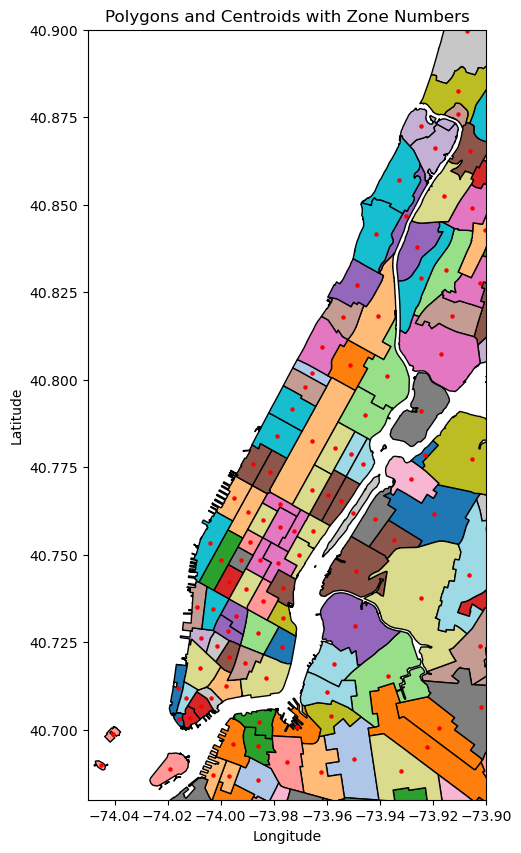

In [45]:
# Define the x and y plot ranges
x_min, x_max = -74.05, -73.9  # Example longitude range
y_min, y_max = 40.68, 40.90    # Example latitude range

# Plot the polygons and centroids
fig, ax = plt.subplots(1, 1, figsize=(10, 10))

# Plot polygons
taxi_zone.plot(column='zone', ax=ax, legend=False, cmap='tab20', edgecolor='black')

# Plot centroids
taxi_zone['centroid'].plot(ax=ax, color='red', markersize=5)

# # Annotate centroids with the zone number
# for idx, row in taxi_zone.iterrows():
#     plt.text(row['centroid'].x, row['centroid'].y, row['location_id'], fontsize=12, ha='center', va='center', color='blue')

# Add titles and labels
ax.set_title('Polygons and Centroids with Zone Numbers')
ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')

ax.set_xlim(x_min, x_max)
ax.set_ylim(y_min, y_max)
# Show the plot
plt.show()

KeyError: 'centroid'

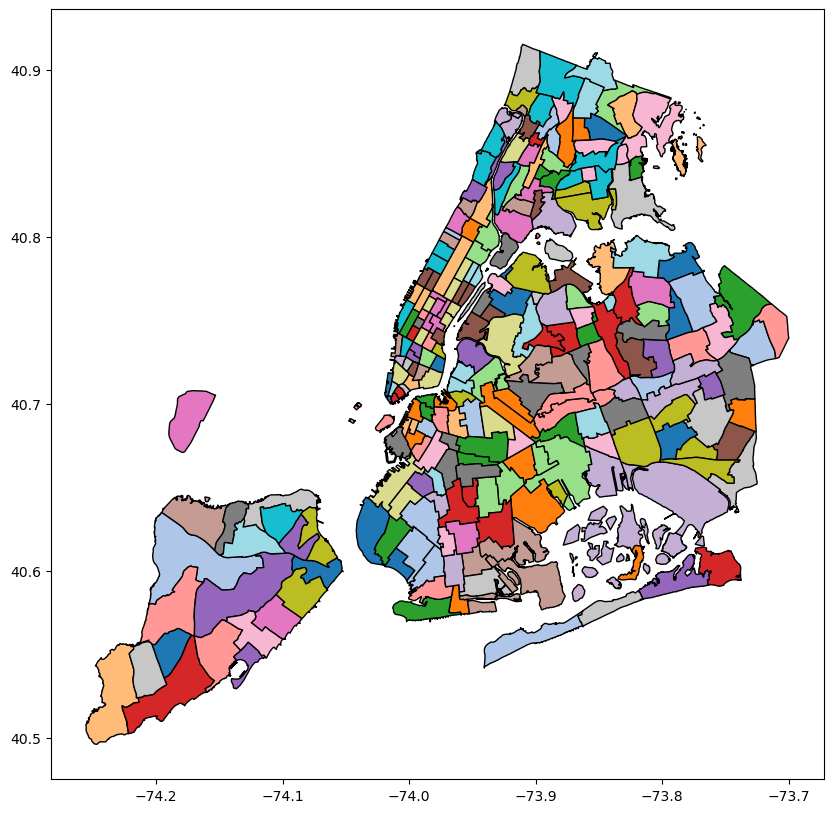

In [31]:
import matplotlib.pyplot as plt

# Define the x and y plot ranges
x_min, x_max = -74.05, -73.75  # Example longitude range
y_min, y_max = 40.60, 40.90    # Example latitude range

# Plot the polygons and centroids
fig, ax = plt.subplots(1, 1, figsize=(10, 10))

# Plot polygons
taxi_zone.plot(column='zone', ax=ax, legend=False, cmap='tab20', edgecolor='black')

# Plot centroids
taxi_zone['centroid'].plot(ax=ax, color='red', markersize=5)

# # Annotate centroids with the zone number
# for idx, row in taxi_zone.iterrows():
#     plt.text(row['centroid'].x, row['centroid'].y, row['location_id'], fontsize=12, ha='center', va='center', color='blue')

# Add titles and labels
ax.set_title('Polygons and Centroids with Zone Numbers')
ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')

# Set the plot ranges
ax.set_xlim(x_min, x_max)
ax.set_ylim(y_min, y_max)

# Show the plot
plt.show()


In [249]:
import geopandas as gpd
from shapely.wkt import loads
from shapely.geometry import MultiPolygon

# Sample data, typically you would read this from a CSV file
data = {
    "shape_area": [0.0007823067885],
    "objectid": [1],
    "shape_leng": [0.116357453189],
    "location_id": [1],
    "zone": ["Newark Airport"],
    "borough": ["EWR"],
    "geometry": ["MULTIPOLYGON (((-74.18445 40.69500, -74.18449 40.69500"]
}

# Create a GeoDataFrame
gdf = gpd.GeoDataFrame(data)

# Convert the geometry column from WKT to geometric objects
gdf['geometry'] = gdf['geometry'].apply(loads)

# Calculate the centroid of the MultiPolygon
gdf['centroid'] = gdf['geometry'].centroid

# Print the GeoDataFrame with centroids
print(gdf[['geometry', 'centroid']])

GEOSException: ParseException: Expected word but encountered end of stream

In [45]:
df = pd.DataFrame()

In [46]:
import datetime

# Define the start date
start_date = datetime.datetime(2022, 2, 1, 0, 0, 0)

# Define the number of hours to increment
num_hours = 24 * 28  # For a complete month of February (considering February 2022 has 28 days)

# Create the list of datetime objects incrementing by 1 hour
datetime_array = [start_date + datetime.timedelta(hours=i) for i in range(num_hours)]

# Print the first few elements to verify
print(datetime_array[:10])

""


In [53]:
import datetime

In [48]:
start_date = datetime.datetime(2022, 2, 1, 0, 0, 0)

In [50]:
print(start_date)

2022-02-01 00:00:00


In [53]:
start_date + datetime.timedelta(hours=56)

datetime.datetime(2022, 2, 3, 8, 0)

In [58]:
current_date = datetime.datetime.now()

In [59]:
print(current_date)

2024-06-10 10:29:11.939742


In [60]:
current_date>start_date

True

In [67]:
start_date = datetime.datetime(2022, 2, 1, 0, 0, 0)
current_date = datetime.datetime.now()
df = pd.DataFrame()

while current_date>start_date:
    new_row = {'Date Time': start_date, 'Weather Object': None}
    new_row_df = pd.DataFrame([new_row])
    df = pd.concat([df, new_row_df], ignore_index=True)
    start_date = start_date + datetime.timedelta(hours=1)

In [68]:
df

,Date Time,Weather Object
0,2022-02-01 00:00:00,None
1,2022-02-01 01:00:00,None
2,2022-02-01 02:00:00,None
3,2022-02-01 03:00:00,None
4,2022-02-01 04:00:00,None
...,...,...
20646,2024-06-10 06:00:00,None
20647,2024-06-10 07:00:00,None
20648,2024-06-10 08:00:00,None
20649,2024-06-10 09:00:00,None


In [69]:
df.to_csv('Weather.csv', index=False)

In [55]:
import requests
import json
import logging
import time

lat = '40.7831'
lng = '-73.9712'
APIKey = '1460b81c5dee4671f1e64b7416755c50'
timestamp = int(time.mktime(start_date.timetuple()))

NameError: name 'start_date' is not defined

In [102]:
weather_api = f'https://api.openweathermap.org/data/3.0/onecall/timemachine?lat={lat}&lon={lng}&dt={timestamp}&appid={APIKey}'
try:
    response = requests.get(weather_api)
    if response.status_code == 200:
        weatherData = json.loads(response.text)
    else:
        print(f"Failed to fetch data. Status code: {response.status_code}")
except requests.exceptions.RequestException as e:
    print(f"An error occurred: {e}")

In [103]:
weatherData

{'lat': 40.7831,
 'lon': -73.9712,
 'timezone': 'America/New_York',
 'timezone_offset': -14400,
 'data': [{'dt': 1718013600,
   'sunrise': 1718011453,
   'sunset': 1718065612,
   'temp': 289.83,
   'feels_like': 289.25,
   'pressure': 1005,
   'humidity': 65,
   'dew_point': 283.23,
   'uvi': 0.09,
   'clouds': 0,
   'visibility': 10000,
   'wind_speed': 7.2,
   'wind_deg': 310,
   'wind_gust': 10.8,
   'weather': [{'id': 800,
     'main': 'Clear',
     'description': 'clear sky',
     'icon': '01d'}]}]}

In [110]:
df.loc[df['Date Time'] == '2022-02-01 00:00:00', 'Weather Object'] = str(weatherData)

In [111]:
df

,Date Time,Weather Object
0,2022-02-01 00:00:00,"{'lat': 40.7831, 'lon': -73.9712, 'timezone': ..."
1,2022-02-01 01:00:00,None
2,2022-02-01 02:00:00,None
3,2022-02-01 03:00:00,None
4,2022-02-01 04:00:00,None
...,...,...
20646,2024-06-10 06:00:00,None
20647,2024-06-10 07:00:00,None
20648,2024-06-10 08:00:00,None
20649,2024-06-10 09:00:00,None


In [225]:
df = pd.read_csv('Weather.csv')
df2= pd.read_csv('Weather_inserted.csv')

In [226]:
df.dtypes

Date Time          object
Weather Object    float64
dtype: object

In [116]:
df = pd.read_csv('Weather.csv')
df2= pd.read_csv('Weather_inserted.csv')

lat = '40.7831'
lng = '-73.9712'
APIKey = '1460b81c5dee4671f1e64b7416755c50'
APIKey2 = '793a8de35846ab99367bc32eff51d90b'

counter = 998

for index, row in df.iterrows():
    dt_obj = datetime.datetime.strptime(row['Date Time'], '%Y-%m-%d %H:%M:%S')
    timestamp = int(time.mktime(dt_obj.timetuple()))
    
    weather_api = f'https://api.openweathermap.org/data/3.0/onecall/timemachine?lat={lat}&lon={lng}&dt={timestamp}&appid={APIKey2}'
    try:
        response = requests.get(weather_api)
        if response.status_code == 200:
            weatherData = json.loads(response.text)
        else:
            print(f"Failed to fetch data. Status code: {response.status_code}")
    except requests.exceptions.RequestException as e:
        print(f"An error occurred: {e}",index)
        
    df2.loc[df2['Date Time'] == row['Date Time'], 'Weather Object'] = str(weatherData)
    df = df.drop(index)
    
    
    counter-=1
    if counter == 0:
        break

df.to_csv('Weather.csv', index=False)
df2.to_csv('Weather_inserted.csv', index=False)

In [117]:
df = pd.read_csv('Weather.csv')
df2= pd.read_csv('Weather_inserted.csv')

lat = '40.7831'
lng = '-73.9712'
APIKey = '1460b81c5dee4671f1e64b7416755c50'
APIKey2 = '793a8de35846ab99367bc32eff51d90b'

counter = 998

for index, row in df.iterrows():
    dt_obj = datetime.datetime.strptime(row['Date Time'], '%Y-%m-%d %H:%M:%S')
    timestamp = int(time.mktime(dt_obj.timetuple()))
    
    weather_api = f'https://api.openweathermap.org/data/3.0/onecall/timemachine?lat={lat}&lon={lng}&dt={timestamp}&appid={APIKey}'
    try:
        response = requests.get(weather_api)
        if response.status_code == 200:
            weatherData = json.loads(response.text)
        else:
            print(f"Failed to fetch data. Status code: {response.status_code}")
    except requests.exceptions.RequestException as e:
        print(f"An error occurred: {e}",index)
        
    df2.loc[df2['Date Time'] == row['Date Time'], 'Weather Object'] = str(weatherData)
    df = df.drop(index)
    
    
    counter-=1
    if counter == 0:
        break

df.to_csv('Weather.csv', index=False)
df2.to_csv('Weather_inserted.csv', index=False)

In [118]:
df

,Date Time,Weather Object


In [7]:
df2= pd.read_csv('Weather_inserted.csv')
df2

,Date Time,Weather Object
0,2022-02-01 00:00:00,"{'lat': 40.7831, 'lon': -73.9712, 'timezone': ..."
1,2022-02-01 01:00:00,"{'lat': 40.7831, 'lon': -73.9712, 'timezone': ..."
2,2022-02-01 02:00:00,"{'lat': 40.7831, 'lon': -73.9712, 'timezone': ..."
3,2022-02-01 03:00:00,"{'lat': 40.7831, 'lon': -73.9712, 'timezone': ..."
4,2022-02-01 04:00:00,"{'lat': 40.7831, 'lon': -73.9712, 'timezone': ..."
...,...,...
20646,2024-06-10 06:00:00,"{'lat': 40.7831, 'lon': -73.9712, 'timezone': ..."
20647,2024-06-10 07:00:00,"{'lat': 40.7831, 'lon': -73.9712, 'timezone': ..."
20648,2024-06-10 08:00:00,"{'lat': 40.7831, 'lon': -73.9712, 'timezone': ..."
20649,2024-06-10 09:00:00,"{'lat': 40.7831, 'lon': -73.9712, 'timezone': ..."


In [221]:
lat = '40.7831'
lng = '-73.9712'
APIKey = '1460b81c5dee4671f1e64b7416755c50'
APIKey2 = '793a8de35846ab99367bc32eff51d90b'
timestamp = int(time.mktime(start_date.timetuple()))
weather_api = f'https://api.openweathermap.org/data/3.0/onecall/timemachine?lat={lat}&lon={lng}&dt={timestamp}&appid={APIKey2}'
print(weather_api)

https://api.openweathermap.org/data/3.0/onecall/timemachine?lat=40.7831&lon=-73.9712&dt=1718013600&appid=793a8de35846ab99367bc32eff51d90b


In [215]:
#dont run this with high limit
limit  = dataset size (58799739)
offset = 0
subway_hourly_api = f'https://data.ny.gov/resource/wujg-7c2s.json?$limit={limit}&$offset={offset}'
try:
    response = requests.get(subway_hourly_api)
    if response.status_code == 200:
        subwayData = pd.read_json(f'https://data.ny.gov/resource/wujg-7c2s.json?$limit={limit}&$offset={offset}')
    else:
        print(f"Failed to fetch data. Status code: {response.status_code}")
except requests.exceptions.RequestException as e:
    print(f"An error occurred: {e}")

SyntaxError: invalid syntax (535065316.py, line 2)

In [237]:
def save_subway(limit, offset, name):
    subway_hourly_api = f'https://data.ny.gov/resource/wujg-7c2s.json?$limit={limit}&$offset={offset}'
    try:
        response = requests.get(subway_hourly_api)
        if response.status_code == 200:
            subwayData = pd.read_json(f'https://data.ny.gov/resource/wujg-7c2s.json?$limit={limit}&$offset={offset}')
            subwayData = subwayData.loc[:, subwayData.columns.intersection(['transit_timestamp','ridership','latitude','longitude'])]
            subwayData.to_csv(f'{name}.csv', index=False)
        else:
            print(f"Failed to fetch data. Status code: {response.status_code}", limit, offset)
    except requests.exceptions.RequestException as e:
        print(f"An error occurred: {e}", limit, offset)

In [240]:
for i in range(53,59):
    print(i)
    limit = 1000000
    offset = i*limit
    save_subway(limit, offset, f'subway/subway_data_{i}')

53
54
55
56
57
58


In [236]:
subwayData = subwayData.loc[:, subwayData.columns.intersection(['transit_timestamp','ridership','latitude','longitude'])]
subwayData

,transit_timestamp,ridership,latitude,longitude
0,2023-11-15T09:00:00.000,33,40.710373,-74.006570
1,2023-11-15T09:00:00.000,73,40.699814,-73.911580
2,2023-11-15T09:00:00.000,116,40.692337,-73.985940
3,2023-11-15T09:00:00.000,20,40.620670,-73.990420
4,2023-11-15T09:00:00.000,27,40.764812,-73.973350
...,...,...,...,...
9995,2023-11-15T22:00:00.000,33,40.764630,-73.966110
9996,2023-11-15T22:00:00.000,6,40.742878,-73.992820
9997,2023-11-15T22:00:00.000,12,40.666270,-73.980310
9998,2023-11-15T22:00:00.000,2,40.660366,-73.979490


In [409]:
limit = 10000
offset = 0


Bus = pd.read_json(f'https://data.ny.gov/resource/kv7t-n8in.json?$limit={limit}&$offset={offset}')
Bus

# sub = subwayData.loc[(df['fare_amount'] > 0)]  # & (df['passenger_count'] > 0)]

,transit_timestamp,bus_route,payment_method,fare_class_category,ridership,transfers
0,2022-02-01T05:00:00.000,B1,metrocard,Metrocard - Fair Fare,4,0
1,2022-02-01T06:00:00.000,B1,metrocard,Metrocard - Fair Fare,10,1
2,2022-02-01T07:00:00.000,B1,metrocard,Metrocard - Fair Fare,25,5
3,2022-02-01T08:00:00.000,B1,metrocard,Metrocard - Fair Fare,35,4
4,2022-02-01T09:00:00.000,B1,metrocard,Metrocard - Fair Fare,22,3
...,...,...,...,...,...,...
9995,2022-06-18T06:00:00.000,B1,metrocard,Metrocard - Full Fare,57,13
9996,2022-06-18T07:00:00.000,B1,metrocard,Metrocard - Full Fare,136,26
9997,2022-06-18T08:00:00.000,B1,metrocard,Metrocard - Full Fare,137,34
9998,2022-06-18T09:00:00.000,B1,metrocard,Metrocard - Full Fare,134,41


In [304]:
sub = subwayData.loc[(subwayData['transfers'] > 0)]  # & (df['passenger_count'] > 0)]

In [306]:
sub.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1866 entries, 5 to 9989
Data columns (total 15 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   transit_timestamp            1866 non-null   object 
 1   transit_mode                 1866 non-null   object 
 2   station_complex_id           1866 non-null   object 
 3   station_complex              1866 non-null   object 
 4   borough                      1866 non-null   object 
 5   payment_method               1866 non-null   object 
 6   fare_class_category          1866 non-null   object 
 7   ridership                    1866 non-null   int64  
 8   transfers                    1866 non-null   int64  
 9   latitude                     1866 non-null   float64
 10  longitude                    1866 non-null   float64
 11  georeference                 1866 non-null   object 
 12  :@computed_region_kjdx_g34t  1864 non-null   float64
 13  :@computed_region_yamh_

In [310]:
import psycopg2

connection = psycopg2.connect(database="dbname", user="username", password="pass", host="hostname", port=5432)

cursor = connection.cursor()

cursor.execute("SELECT * from portal.portal_users;")

# Fetch all rows from database
record = cursor.fetchall()

print("Data from Database:- ", record)

OperationalError: could not translate host name "hostname" to address: nodename nor servname provided, or not known


In [311]:
import psycopg2

In [14]:
import os
rootdir = '/Users/brianmcmahon/Downloads/CitiBike/filtered'
file_array = []
for subdir, dirs, files in os.walk(rootdir):
    for file in files:
        x = os.path.join(subdir, file)
        if x[-3:] == 'csv':
            file_array.append(x)
            
print(file_array)

['/Users/brianmcmahon/Downloads/CitiBike/filtered/filtered_citibike_47.csv', '/Users/brianmcmahon/Downloads/CitiBike/filtered/filtered_citibike_53.csv', '/Users/brianmcmahon/Downloads/CitiBike/filtered/filtered_citibike_52.csv', '/Users/brianmcmahon/Downloads/CitiBike/filtered/filtered_citibike_46.csv', '/Users/brianmcmahon/Downloads/CitiBike/filtered/filtered_citibike_50.csv', '/Users/brianmcmahon/Downloads/CitiBike/filtered/filtered_citibike_44.csv', '/Users/brianmcmahon/Downloads/CitiBike/filtered/filtered_citibike_45.csv', '/Users/brianmcmahon/Downloads/CitiBike/filtered/filtered_citibike_51.csv', '/Users/brianmcmahon/Downloads/CitiBike/filtered/filtered_citibike_55.csv', '/Users/brianmcmahon/Downloads/CitiBike/filtered/filtered_citibike_41.csv', '/Users/brianmcmahon/Downloads/CitiBike/filtered/filtered_citibike_69.csv', '/Users/brianmcmahon/Downloads/CitiBike/filtered/filtered_citibike_68.csv', '/Users/brianmcmahon/Downloads/CitiBike/filtered/filtered_citibike_40.csv', '/Users/bri

In [354]:
citibike = pd.read_csv(file_array[0])
citibike

/var/folders/sd/qz26czhx16b2xpkykv904f380000gn/T/ipykernel_73708/2852390709.py:1: DtypeWarning: Columns (5,7) have mixed types. Specify dtype option on import or set low_memory=False.
  citibike = pd.read_csv(file_array[0])


,ride_id,rideable_type,started_at,ended_at,start_station_name,start_station_id,end_station_name,end_station_id,start_lat,start_lng,end_lat,end_lng,member_casual
0,9388A6CB0FB20BA6,classic_bike,2023-04-19 16:50:36,2023-04-19 16:58:53,Leonard St & Church St,5359.11,W 17 St & 8 Ave,6148.02,40.717580,-74.005672,40.741776,-74.001497,member
1,164F7BA30F9B8B8E,electric_bike,2023-04-18 17:02:18,2023-04-18 17:03:55,Grand Ave & Bergen St,4190.06,Bergen St & Vanderbilt Ave,4157.10,40.678045,-73.962408,40.679439,-73.968044,member
2,10E16DD7DACDDBD0,classic_bike,2023-04-17 14:25:48,2023-04-17 14:32:12,Graham Ave & Grand St,5178.06,Driggs Ave & S 2 St,5235.10,40.711827,-73.944007,40.710000,-73.960000,member
3,CEAE2DF5AAD61183,classic_bike,2023-04-20 21:28:47,2023-04-20 21:42:02,Graham Ave & Grand St,5178.06,Driggs Ave & S 2 St,5235.10,40.711863,-73.944024,40.710000,-73.960000,member
4,992CF2B93656E3A7,classic_bike,2023-04-14 19:52:07,2023-04-14 19:59:33,8 Ave & W 16 St,6072.11,8 Ave & W 31 St,6450.05,40.740983,-74.001702,40.750585,-73.994685,member
...,...,...,...,...,...,...,...,...,...,...,...,...,...
854345,DFC55A165D6269E9,classic_bike,2023-04-02 13:35:16,2023-04-02 13:50:28,DeKalb Ave & Vanderbilt Ave,4461.04,Huron St & Franklin St,5869.04,40.689437,-73.968913,40.732660,-73.958260,member
854346,4F92053698BB6273,electric_bike,2023-04-04 23:10:58,2023-04-04 23:12:31,Madison Ave & E 120 St,7667.04,Mt Morris Park W & W 120 St,7685.14,40.802950,-73.942954,40.804038,-73.945925,member
854347,260D9EAAC23F4070,classic_bike,2023-04-12 08:28:13,2023-04-12 08:34:35,W 17 St & 8 Ave,6148.02,W 25 St & 6 Ave,6215.04,40.741776,-74.001497,40.743954,-73.991449,member
854348,45EE681A9B0A8245,classic_bike,2023-04-19 19:30:04,2023-04-19 19:32:30,Madison Ave & E 120 St,7667.04,Mt Morris Park W & W 120 St,7685.14,40.802950,-73.942954,40.804038,-73.945925,member


In [407]:
import os
import pandas

def citibike_filter():
    rootdir = '/Users/brianmcmahon/Downloads/CitiBike'
#     rootdir1 = '/Users/brianmcmahon/Downloads/CitiBike/2022-citibike-tripdata'
    rootdir1 = '/Users/brianmcmahon/Downloads/CitiBike/2023-citibike-tripdata'
    file_array = []
    for subdir, dirs, files in os.walk(rootdir1):
        for file in files:
            x = os.path.join(subdir, file)
            if x[-3:] == 'csv':
                file_array.append(x)

#     print(file_array)
    file_number = 37
    for file in file_array:
        
        citibike = pd.read_csv(file)



        #filters for citibike dataframe
        condition_1 = citibike['started_at'].notna()
        condition_2 = citibike['ended_at'].notna()
        condition_3 = citibike['started_at'] < citibike['ended_at']
        condition_4 = citibike['start_lat'].notna()
        condition_5 = citibike['start_lng'].notna()
        condition_6 = citibike['end_lat'].notna()
        condition_7 = citibike['end_lng'].notna()

        combined_condition = (
            condition_1 & 
            condition_2 & 
            condition_3 & 
            condition_4 & 
            condition_5 & 
            condition_6 & 
            condition_7
        )

        #apply filters to seperate good and bad data (save removed rows)
        filtered_citibike = citibike[combined_condition]
        removed_citibike = citibike[~combined_condition]
        removed_citibike.to_csv(str(rootdir)+f'/removed/removed_citibike_{file_number}.csv', index=False)

        #changing datetime to unixtimestamp
        filtered_citibike['started_at'] = pd.to_datetime(filtered_citibike['started_at'])
        filtered_citibike['started_at_unix'] = filtered_citibike['started_at'].view('int64') // 10**9
        filtered_citibike['ended_at'] = pd.to_datetime(filtered_citibike['ended_at'])
        filtered_citibike['ended_at_unix'] = filtered_citibike['ended_at'].view('int64') // 10**9

        #remove columns that are unnecessary
        filtered_citibike = filtered_citibike.loc[:, filtered_citibike.columns.intersection(['started_at_unix','ended_at_unix','start_lat','start_lng','end_lat','end_lng'])]
        
        
        filtered_citibike.to_csv(str(rootdir)+f'/filtered/filtered_citibike_{file_number}.csv', index=False)
        file_number += 1

In [429]:
citibike#_filter()

,ride_id,rideable_type,started_at,ended_at,start_station_name,start_station_id,end_station_name,end_station_id,start_lat,start_lng,end_lat,end_lng,member_casual,started_at_unix,ended_at_unix
0,9388A6CB0FB20BA6,classic_bike,2023-04-19 16:50:36,2023-04-19 16:58:53,Leonard St & Church St,5359.11,W 17 St & 8 Ave,6148.02,40.717580,-74.005672,40.741776,-74.001497,member,1681923036,1681923533
1,164F7BA30F9B8B8E,electric_bike,2023-04-18 17:02:18,2023-04-18 17:03:55,Grand Ave & Bergen St,4190.06,Bergen St & Vanderbilt Ave,4157.10,40.678045,-73.962408,40.679439,-73.968044,member,1681837338,1681837435
2,10E16DD7DACDDBD0,classic_bike,2023-04-17 14:25:48,2023-04-17 14:32:12,Graham Ave & Grand St,5178.06,Driggs Ave & S 2 St,5235.10,40.711827,-73.944007,40.710000,-73.960000,member,1681741548,1681741932
3,CEAE2DF5AAD61183,classic_bike,2023-04-20 21:28:47,2023-04-20 21:42:02,Graham Ave & Grand St,5178.06,Driggs Ave & S 2 St,5235.10,40.711863,-73.944024,40.710000,-73.960000,member,1682026127,1682026922
4,992CF2B93656E3A7,classic_bike,2023-04-14 19:52:07,2023-04-14 19:59:33,8 Ave & W 16 St,6072.11,8 Ave & W 31 St,6450.05,40.740983,-74.001702,40.750585,-73.994685,member,1681501927,1681502373
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
854345,DFC55A165D6269E9,classic_bike,2023-04-02 13:35:16,2023-04-02 13:50:28,DeKalb Ave & Vanderbilt Ave,4461.04,Huron St & Franklin St,5869.04,40.689437,-73.968913,40.732660,-73.958260,member,1680442516,1680443428
854346,4F92053698BB6273,electric_bike,2023-04-04 23:10:58,2023-04-04 23:12:31,Madison Ave & E 120 St,7667.04,Mt Morris Park W & W 120 St,7685.14,40.802950,-73.942954,40.804038,-73.945925,member,1680649858,1680649951
854347,260D9EAAC23F4070,classic_bike,2023-04-12 08:28:13,2023-04-12 08:34:35,W 17 St & 8 Ave,6148.02,W 25 St & 6 Ave,6215.04,40.741776,-74.001497,40.743954,-73.991449,member,1681288093,1681288475
854348,45EE681A9B0A8245,classic_bike,2023-04-19 19:30:04,2023-04-19 19:32:30,Madison Ave & E 120 St,7667.04,Mt Morris Park W & W 120 St,7685.14,40.802950,-73.942954,40.804038,-73.945925,member,1681932604,1681932750


In [357]:
database1 = "Research Practicum"
user1="brian.mcmahon1@ucdconnect.ie"
password1="@dm1n_br1@n5693"
host1="137.43.49.32"

connection = psycopg2.connect(database = database1 , user = user1, password = password1, host = host1, port=5432)

cursor = connection.cursor()

cursor.execute("SELECT * from portal.portal_users;")

# Fetch all rows from database
record = cursor.fetchall()

print("Data from Database:- ", record)

OperationalError: could not connect to server: Operation timed out
	Is the server running on host "137.43.49.32" and accepting
	TCP/IP connections on port 5432?


In [363]:
database1 = "comp47360_db"
user1 = "brian.mcmahon1"#@ucdconnect.ie"
password1="@dm1n_br1@n5693"
host1 = "137.43.49.32"



try:
    # Establish the connection
    connection = psycopg2.connect(database=database1, user=user1, password=password1, host=host1, port=5432)
    cursor = connection.cursor()
    print("Database connection established.")

    # Execute the query
    cursor.execute("SELECT * FROM portal.portal_users;")
    
    # Fetch all rows from database
    record = cursor.fetchall()
    
    print("Data from Database:- ", record)

except Exception as error:
    print("Error while connecting to PostgreSQL", error)

finally:
    # Closing the connection
    if connection:
        cursor.close()
        connection.close()
        print("PostgreSQL connection is closed.")

Error while connecting to PostgreSQL could not connect to server: Operation timed out
	Is the server running on host "137.43.49.32" and accepting
	TCP/IP connections on port 5432?



NameError: name 'connection' is not defined

In [362]:
#!/usr/bin/env python
#
# Small script to show Pyscopg2 cursor
import psycopg2
#
database1 = "comp47360_db"
user1 = "brian.mcmahon1"#@ucdconnect.ie"
password1="@dm1n_br1@n5693"
host1 = "137.43.49.32"
import psycopg2

try:
    conn = psycopg2.connect("dbname='postgres' user='brian.mcmahon1' host='137.43.49.32' password='@dm1n_br1@n5693'")
except:
    print("I am unable to connect to the database")

# we use a context manager to scope the cursor session
with conn.cursor() as curs:

    try:
        # simple single row system query
        curs.execute("SELECT version()")

        # returns a single row as a tuple
        single_row = curs.fetchone()

        # use an f-string to print the single tuple returned
        print(f"{single_row}")

        # simple multi row system query
        curs.execute("SELECT query, backend_type FROM pg_stat_activity")

        # a default install should include this query and some backend workers
        many_rows = curs.fetchmany(5)

        # use the * unpack operator to print many_rows which is a Python list
        print(*many_rows, sep = "\n")

    # a more robust way of handling errors
    except (Exception, psycopg2.DatabaseError) as error:
        print(error)

I am unable to connect to the database


NameError: name 'conn' is not defined

In [60]:
df = pd.read_parquet('yellow_tripdata_2023-01.parquet', engine='pyarrow')
df

,VendorID,tpep_pickup_datetime,tpep_dropoff_datetime,passenger_count,trip_distance,RatecodeID,store_and_fwd_flag,PULocationID,DOLocationID,payment_type,fare_amount,extra,mta_tax,tip_amount,tolls_amount,improvement_surcharge,total_amount,congestion_surcharge,airport_fee
0,2,2023-01-01 00:32:10,2023-01-01 00:40:36,1.0,0.97,1.0,N,161,141,2,9.30,1.00,0.5,0.00,0.0,1.0,14.30,2.5,0.00
1,2,2023-01-01 00:55:08,2023-01-01 01:01:27,1.0,1.10,1.0,N,43,237,1,7.90,1.00,0.5,4.00,0.0,1.0,16.90,2.5,0.00
2,2,2023-01-01 00:25:04,2023-01-01 00:37:49,1.0,2.51,1.0,N,48,238,1,14.90,1.00,0.5,15.00,0.0,1.0,34.90,2.5,0.00
3,1,2023-01-01 00:03:48,2023-01-01 00:13:25,0.0,1.90,1.0,N,138,7,1,12.10,7.25,0.5,0.00,0.0,1.0,20.85,0.0,1.25
4,2,2023-01-01 00:10:29,2023-01-01 00:21:19,1.0,1.43,1.0,N,107,79,1,11.40,1.00,0.5,3.28,0.0,1.0,19.68,2.5,0.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3066761,2,2023-01-31 23:58:34,2023-02-01 00:12:33,NaN,3.05,NaN,None,107,48,0,15.80,0.00,0.5,3.96,0.0,1.0,23.76,NaN,NaN
3066762,2,2023-01-31 23:31:09,2023-01-31 23:50:36,NaN,5.80,NaN,None,112,75,0,22.43,0.00,0.5,2.64,0.0,1.0,29.07,NaN,NaN
3066763,2,2023-01-31 23:01:05,2023-01-31 23:25:36,NaN,4.67,NaN,None,114,239,0,17.61,0.00,0.5,5.32,0.0,1.0,26.93,NaN,NaN
3066764,2,2023-01-31 23:40:00,2023-01-31 23:53:00,NaN,3.15,NaN,None,230,79,0,18.15,0.00,0.5,4.43,0.0,1.0,26.58,NaN,NaN


In [33]:
#taxi

# taxi = pd.read_parquet('green_tripdata_2024-01.parquet', engine='pyarrow')
def taxi_tansform(taxi,i):
    #filters for taxi dataframe
    condition_1 = taxi['passenger_count']>0
    condition_2 = taxi['fare_amount']>0
    condition_3 = taxi['passenger_count'].notna()
    condition_4 = taxi['fare_amount'].notna()
    condition_5 = taxi['tpep_pickup_datetime'] < taxi['tpep_dropoff_datetime']

    combined_condition = (
        condition_1 & 
        condition_2 & 
        condition_3 & 
        condition_4 & 
        condition_5 
    )

    #apply filters to seperate good and bad data
    filtered_taxi = taxi[combined_condition]

    #changing datetime to unixtimestamp
    filtered_taxi['tpep_pickup_datetime'] = pd.to_datetime(filtered_taxi['tpep_pickup_datetime'])
    filtered_taxi['started_at_unix'] = filtered_taxi['tpep_pickup_datetime'].view('int64') // 10**9
    filtered_taxi['tpep_dropoff_datetime'] = pd.to_datetime(filtered_taxi['tpep_dropoff_datetime'])
    filtered_taxi['ended_at_unix'] = filtered_taxi['tpep_dropoff_datetime'].view('int64') // 10**9

    #remove columns that are unnecessary


    # print(df[df['PULocationID']==4 or df['DOLocationID']==4])

    result = pd.merge(filtered_taxi, taxi_zone, left_on='PULocationID', right_on='location_id', how='left')
    result = result.drop(columns=['shape_area','zone','borough','geometry','objectid','shape_leng','location_id'])
    result = result.rename(columns={'centroid': 'PULocationCentroid'})

    result = pd.merge(result, taxi_zone, left_on='DOLocationID', right_on='location_id', how='left')
    result = result.drop(columns=['shape_area','zone','borough','geometry','objectid','shape_leng','location_id'])
    result = result.rename(columns={'centroid': 'DOLocationCentroid'})

    # result['PULocationCentroid'].x
    # Extract x and y coordinates from the centroids
    result['start_lng'] = result['PULocationCentroid'].apply(lambda point: point.x if point is not None else None)
    result['start_lat'] = result['PULocationCentroid'].apply(lambda point: point.y if point is not None else None)
    result['end_lng'] = result['DOLocationCentroid'].apply(lambda point: point.x if point is not None else None)
    result['end_lat'] = result['DOLocationCentroid'].apply(lambda point: point.y if point is not None else None)

    result = result.loc[:, result.columns.intersection(['started_at_unix','ended_at_unix','passenger_count','start_lng','start_lat','end_lng','end_lat'])]



    condition_6 = result['start_lat'].notna()
    condition_7 = result['start_lng'].notna()
    condition_8 = result['end_lat'].notna()
    condition_9 = result['end_lng'].notna()

    combined_condition_2 = (
        condition_6 & 
        condition_7 & 
        condition_8 & 
        condition_9
    )

    filtered_taxi_2 = result[combined_condition_2]
#     return filtered_taxi_2
    filtered_taxi_2.to_csv('/Users/brianmcmahon/Downloads/yellow_taxi_clean/'+i[50:-7]+'csv', index=False)



In [63]:
#taxi

# taxi = pd.read_parquet('green_tripdata_2024-01.parquet', engine='pyarrow')
def taxi_tansform(loadname, savename,yyyy,mm):
    taxi = pd.read_parquet(loadname, engine='pyarrow')
    #filters for taxi dataframe
    condition_1 = taxi['passenger_count']>0
    condition_2 = taxi['fare_amount']>0
    condition_3 = taxi['passenger_count'].notna()
    condition_4 = taxi['fare_amount'].notna()
    condition_5 = taxi['tpep_pickup_datetime'] < taxi['tpep_dropoff_datetime']
    condition_year = pd.DatetimeIndex(taxi['tpep_pickup_datetime']).year == yyyy
    condition_month = pd.DatetimeIndex(taxi['tpep_pickup_datetime']).month == mm
    
    combined_condition = (
        condition_1 & 
        condition_2 & 
        condition_3 & 
        condition_4 & 
        condition_5 &
        condition_year &
        condition_month
    )

    #apply filters to seperate good and bad data
    filtered_taxi = taxi[combined_condition]

    #changing datetime to unixtimestamp
    filtered_taxi['tpep_pickup_datetime'] = pd.to_datetime(filtered_taxi['tpep_pickup_datetime'])
    filtered_taxi['started_at_unix'] = filtered_taxi['tpep_pickup_datetime'].view('int64') // 10**9
    filtered_taxi['tpep_dropoff_datetime'] = pd.to_datetime(filtered_taxi['tpep_dropoff_datetime'])
    filtered_taxi['ended_at_unix'] = filtered_taxi['tpep_dropoff_datetime'].view('int64') // 10**9

    #remove columns that are unnecessary


    # print(df[df['PULocationID']==4 or df['DOLocationID']==4])

    result = pd.merge(filtered_taxi, taxi_zone, left_on='PULocationID', right_on='location_id', how='left')
    result = result.drop(columns=['shape_area','zone','borough','geometry','objectid','shape_leng','location_id'])
    result = result.rename(columns={'centroid': 'PULocationCentroid'})

    result = pd.merge(result, taxi_zone, left_on='DOLocationID', right_on='location_id', how='left')
    result = result.drop(columns=['shape_area','zone','borough','geometry','objectid','shape_leng','location_id'])
    result = result.rename(columns={'centroid': 'DOLocationCentroid'})

    # result['PULocationCentroid'].x
    # Extract x and y coordinates from the centroids
    result['start_lng'] = result['PULocationCentroid'].apply(lambda point: point.x if point is not None else None)
    result['start_lat'] = result['PULocationCentroid'].apply(lambda point: point.y if point is not None else None)
    result['end_lng'] = result['DOLocationCentroid'].apply(lambda point: point.x if point is not None else None)
    result['end_lat'] = result['DOLocationCentroid'].apply(lambda point: point.y if point is not None else None)

    result = result.loc[:, result.columns.intersection(['started_at_unix','ended_at_unix','passenger_count','start_lng','start_lat','end_lng','end_lat'])]



    condition_6 = result['start_lat'].notna()
    condition_7 = result['start_lng'].notna()
    condition_8 = result['end_lat'].notna()
    condition_9 = result['end_lng'].notna()

    combined_condition_2 = (
        condition_6 & 
        condition_7 & 
        condition_8 & 
        condition_9
    )

    filtered_taxi_2 = result[combined_condition_2]
#     return filtered_taxi_2
    filtered_taxi_2.to_csv(savename, index=False)
#     return filtered_taxi_2


In [64]:
# taxi = pd.read_parquet('/Users/brianmcmahon/Downloads/yellow_tripdata_2023-06.parquet', engine='pyarrow')
rootdir = '/Users/brianmcmahon/Documents/Research Practicum/Data/taxi/'
loadname = 'yellow_tripdata_2024-01.parquet'
savename = 'yellow_tripdata_clean_2024-01.csv'

taxi_tansform(rootdir + loadname,rootdir + savename,2024,1)

loadname = 'yellow_tripdata_2024-02.parquet'
savename = 'yellow_tripdata_clean_2024-02.csv'

taxi_tansform(rootdir + loadname,rootdir + savename,2024,2)

loadname = 'yellow_tripdata_2024-03.parquet'
savename = 'yellow_tripdata_clean_2024-03.csv'

taxi_tansform(rootdir + loadname,rootdir + savename,2024,3)

loadname = 'yellow_tripdata_2024-04.parquet'
savename = 'yellow_tripdata_clean_2024-04.csv'

taxi_tansform(rootdir + loadname,rootdir + savename,2024,4)

In [60]:
min(taxi['started_at_unix'])

1704067200

In [57]:
taxi_orig = pd.read_parquet(rootdir + loadname, engine='pyarrow')
# dt.year(min(taxi_orig['tpep_pickup_datetime']))
taxi_orig['year'] = pd.DatetimeIndex(taxi_orig['tpep_pickup_datetime']).year
min(taxi_orig['year']) ==2024
pd.DatetimeIndex(taxi_orig['tpep_pickup_datetime']).month

Index([1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       ...
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1],
      dtype='int32', name='tpep_pickup_datetime', length=2964624)

In [99]:
for i in file_array[1:]:
    print(i)
    taxi = pd.read_parquet(i, engine='pyarrow')
    taxi_tansform(taxi,i)


/Users/brianmcmahon/Downloads/yellow_taxi_2022_23/yellow_tripdata_2022-10.parquet
/Users/brianmcmahon/Downloads/yellow_taxi_2022_23/yellow_tripdata_2022-09.parquet
/Users/brianmcmahon/Downloads/yellow_taxi_2022_23/yellow_tripdata_2022-08.parquet
/Users/brianmcmahon/Downloads/yellow_taxi_2022_23/yellow_tripdata_2023-07.parquet
/Users/brianmcmahon/Downloads/yellow_taxi_2022_23/yellow_tripdata_2022-01.parquet
/Users/brianmcmahon/Downloads/yellow_taxi_2022_23/yellow_tripdata_2022-11.parquet
/Users/brianmcmahon/Downloads/yellow_taxi_2022_23/yellow_tripdata_2023-05.parquet
/Users/brianmcmahon/Downloads/yellow_taxi_2022_23/yellow_tripdata_2022-03.parquet
/Users/brianmcmahon/Downloads/yellow_taxi_2022_23/yellow_tripdata_2023-04.parquet
/Users/brianmcmahon/Downloads/yellow_taxi_2022_23/yellow_tripdata_2022-02.parquet
/Users/brianmcmahon/Downloads/yellow_taxi_2022_23/yellow_tripdata_2022-12.parquet
/Users/brianmcmahon/Downloads/yellow_taxi_2022_23/yellow_tripdata_2023-08.parquet
/Users/brianmcma

In [82]:


import os
rootdir = '/Users/brianmcmahon/Downloads/yellow_taxi_2022_23'
file_array = []
for subdir, dirs, files in os.walk(rootdir):
    for file in files:
        x = os.path.join(subdir, file)
        if x[-3:] == 'uet':
            file_array.append(x)
            
print(file_array)

['/Users/brianmcmahon/Downloads/yellow_taxi_2022_23/yellow_tripdata_2023-06.parquet', '/Users/brianmcmahon/Downloads/yellow_taxi_2022_23/yellow_tripdata_2022-10.parquet', '/Users/brianmcmahon/Downloads/yellow_taxi_2022_23/yellow_tripdata_2022-09.parquet', '/Users/brianmcmahon/Downloads/yellow_taxi_2022_23/yellow_tripdata_2022-08.parquet', '/Users/brianmcmahon/Downloads/yellow_taxi_2022_23/yellow_tripdata_2023-07.parquet', '/Users/brianmcmahon/Downloads/yellow_taxi_2022_23/yellow_tripdata_2022-01.parquet', '/Users/brianmcmahon/Downloads/yellow_taxi_2022_23/yellow_tripdata_2022-11.parquet', '/Users/brianmcmahon/Downloads/yellow_taxi_2022_23/yellow_tripdata_2023-05.parquet', '/Users/brianmcmahon/Downloads/yellow_taxi_2022_23/yellow_tripdata_2022-03.parquet', '/Users/brianmcmahon/Downloads/yellow_taxi_2022_23/yellow_tripdata_2023-04.parquet', '/Users/brianmcmahon/Downloads/yellow_taxi_2022_23/yellow_tripdata_2022-02.parquet', '/Users/brianmcmahon/Downloads/yellow_taxi_2022_23/yellow_tripda

In [78]:
result

,tpep_pickup_datetime,tpep_dropoff_datetime,passenger_count,start_lng,start_lat,end_lng,end_lat
0,2023-01-01 00:32:10,2023-01-01 00:40:36,1.0,-73.977698,40.758028,-73.959635,40.766948
1,2023-01-01 00:55:08,2023-01-01 01:01:27,1.0,-73.965554,40.782478,-73.965635,40.768615
2,2023-01-01 00:25:04,2023-01-01 00:37:49,1.0,-73.989845,40.762253,-73.973049,40.791705
3,2023-01-01 00:03:48,2023-01-01 00:13:25,0.0,-73.873629,40.774376,-73.919694,40.761493
4,2023-01-01 00:10:29,2023-01-01 00:21:19,1.0,-73.984052,40.736824,-73.985937,40.727620
...,...,...,...,...,...,...,...
3067968,2023-01-31 23:58:34,2023-02-01 00:12:33,NaN,-73.984052,40.736824,-73.989845,40.762253
3067969,2023-01-31 23:31:09,2023-01-31 23:50:36,NaN,-73.949540,40.729506,-73.945750,40.790011
3067970,2023-01-31 23:01:05,2023-01-31 23:25:36,NaN,-73.997380,40.728340,-73.978632,40.783961
3067971,2023-01-31 23:40:00,2023-01-31 23:53:00,NaN,-73.984196,40.759818,-73.985937,40.727620


In [416]:
from sshtunnel import SSHTunnelForwarder

PORT=5432
with SSHTunnelForwarder(('137.43.49.32', 5432),
         ssh_username='student',
         ssh_password='COMP47360-ResearchPracticum-Group#14',
         remote_bind_address=('localhost', PORT),
         local_bind_address=('localhost', PORT)):
    

#     conn = psycopg2.connect(...)
    print("asd")

asd


In [6]:
from sshtunnel import SSHTunnelForwarder
import psycopg2

# SSH configuration and tunnel setup
ssh_host = '137.43.49.32'  # Replace with your SSH server IP or hostname
ssh_port = 22  # Default SSH port
ssh_username = 'student'
ssh_password = 'COMP47360-ResearchPracticum-Group#14'

postgres_host = 'localhost'
postgres_port = 5432  # Local port that will be tunneled to remote PostgreSQL port

# Function to establish SSH tunnel and connect to PostgreSQL
def connect_to_postgres():
    with SSHTunnelForwarder(
        (ssh_host, ssh_port),
        ssh_username=ssh_username,
        ssh_password=ssh_password,
        remote_bind_address=(postgres_host, postgres_port),
        local_bind_address=('localhost', postgres_port)
    ) as tunnel:
        print(f"Tunnel created via {tunnel.local_bind_address}")

        # Connect to PostgreSQL through the SSH tunnel
        conn = psycopg2.connect(
            database='comp47360_db',
            user='brian.mcmahon1',
            password='@dm1n_br1@n5693',
            host=tunnel.local_bind_host,
            port=tunnel.local_bind_port
        )
        print(conn)

        # Example: Execute SQL query
        cursor = conn.cursor()
        cursor.execute("SELECT * FROM vendtune.citibikes;")
        rows = cursor.fetchall()
        for row in rows:
            print(row)

        # Close the PostgreSQL connection
        conn.close()
        print("PostgreSQL connection closed")

# Call the function to establish SSH tunnel and connect to PostgreSQL
if __name__ == '__main__':
    connect_to_postgres()

Tunnel created via ('127.0.0.1', 5432)
<connection object at 0x14b323370; dsn: 'user=brian.mcmahon1 password=xxx dbname=comp47360_db host=127.0.0.1 port=5432', closed: 0>
PostgreSQL connection closed


In [445]:
from sshtunnel import SSHTunnelForwarder
import psycopg2
import pandas as pd


rootdir = '/Users/brianmcmahon/Downloads/CitiBike/filtered/filtered_citibike_77.csv'


# SSH configuration and tunnel setup
ssh_host = '137.43.49.32'  # Replace with your SSH server IP or hostname
ssh_port = 22  # Default SSH port
ssh_username = 'student'
ssh_password = 'COMP47360-ResearchPracticum-Group#14'

postgres_host = 'localhost'
postgres_port = 5432  # Local port that will be tunneled to remote PostgreSQL port
database = 'comp47360_db'
db_user = 'brian.mcmahon1'
db_password = '@dm1n_br1@n5693'
table_name = 'vendtune."BikeRides"'

# Load your DataFrame
data_test = pd.read_csv('/Users/brianmcmahon/Downloads/CitiBike/filtered/filtered_citibike_77.csv')
# df = pd.DataFrame(data)

# Function to establish SSH tunnel and connect to PostgreSQL
def connect_to_postgres():
    with SSHTunnelForwarder(
        (ssh_host, ssh_port),
        ssh_username=ssh_username,
        ssh_password=ssh_password,
        remote_bind_address=(postgres_host, postgres_port),
        local_bind_address=('localhost', postgres_port)
    ) as tunnel:
        print(f"Tunnel created via {tunnel.local_bind_address}")

        # Connect to PostgreSQL through the SSH tunnel
        conn = psycopg2.connect(
            database=database,
            user=db_user,
            password=db_password,
            host=tunnel.local_bind_host,
            port=tunnel.local_bind_port
        )

        
#         "StartDatetime" FROM vendtune."BikeRides"
        
        
        # Insert DataFrame rows into PostgreSQL table
        cursor = conn.cursor()

        # Prepare the insert query
        insert_query = f"""
        INSERT INTO {table_name} ("StartLat", "StartLng", "EndLat", "EndLng", "StartDatetime", "EndDatetime")
        VALUES (%s, %s, %s, %s, to_timestamp(%s), to_timestamp(%s))
        """

        # Insert rows
        for index, row in data_test.iterrows():
            print(index)
            cursor.execute(insert_query, (
                row['start_lat'],
                row['start_lng'],
                row['end_lat'],
                row['end_lng'],
                row['started_at_unix'],
                row['ended_at_unix']
            ))

        # Commit the transaction
        conn.commit()
        print("Data inserted successfully")

        # Close the PostgreSQL connection
        cursor.close()
        conn.close()
        print("PostgreSQL connection closed")

# Call the function to establish SSH tunnel and connect to PostgreSQL
if __name__ == '__main__':
    connect_to_postgres()


Tunnel created via ('127.0.0.1', 5432)
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
200
201
202
203
204
205
206
207
208
209
210
211
212
213
214
215
216
217
218
219
220
221
222
223
224
225
226
227
228
229
230
231
232
233
234
235
236
237
238
239
240
241
242
243
244
245
246
247
248
249
250
251
252
253
254
255
256
257
258
259
260
261
262
263
264
265
266
267

1859
1860
1861
1862
1863
1864
1865
1866
1867
1868
1869
1870
1871
1872
1873
1874
1875
1876
1877
1878
1879
1880
1881
1882
1883
1884
1885
1886
1887
1888
1889
1890
1891
1892
1893
1894
1895
1896
1897
1898
1899
1900
1901
1902
1903
1904
1905
1906
1907
1908
1909
1910
1911
1912
1913
1914
1915
1916
1917
1918
1919
1920
1921
1922
1923
1924
1925
1926
1927
1928
1929
1930
1931
1932
1933
1934
1935
1936
1937
1938
1939
1940
1941
1942
1943
1944
1945
1946
1947
1948
1949
1950
1951
1952
1953
1954
1955
1956
1957
1958
1959
1960
1961
1962
1963
1964
1965
1966
1967
1968
1969
1970
1971
1972
1973
1974
1975
1976
1977
1978
1979
1980
1981
1982
1983
1984
1985
1986
1987
1988
1989
1990
1991
1992
1993
1994
1995
1996
1997
1998
1999
2000
2001
2002
2003
2004
2005
2006
2007
2008
2009
2010
2011
2012
2013
2014
2015
2016
2017
2018
2019
2020
2021
2022
2023
2024
2025
2026
2027
2028
2029
2030
2031
2032
2033
2034
2035
2036
2037
2038
2039
2040
2041
2042
2043
2044
2045
2046
2047
2048
2049
2050
2051
2052
2053
2054
2055
2056
2057
2058


3509
3510
3511
3512
3513
3514
3515
3516
3517
3518
3519
3520
3521
3522
3523
3524
3525
3526
3527
3528
3529
3530
3531
3532
3533
3534
3535
3536
3537
3538
3539
3540
3541
3542
3543
3544
3545
3546
3547
3548
3549
3550
3551
3552
3553
3554
3555
3556
3557
3558
3559
3560
3561
3562
3563
3564
3565
3566
3567
3568
3569
3570
3571
3572
3573
3574
3575
3576
3577
3578
3579
3580
3581
3582
3583
3584
3585
3586
3587
3588
3589
3590
3591
3592
3593
3594
3595
3596
3597
3598
3599
3600
3601
3602
3603
3604
3605
3606
3607
3608
3609
3610
3611
3612
3613
3614
3615
3616
3617
3618
3619
3620
3621
3622
3623
3624
3625
3626
3627
3628
3629
3630
3631
3632
3633
3634
3635
3636
3637
3638
3639
3640
3641
3642
3643
3644
3645
3646
3647
3648
3649
3650
3651
3652
3653
3654
3655
3656
3657
3658
3659
3660
3661
3662
3663
3664
3665
3666
3667
3668
3669
3670
3671
3672
3673
3674
3675
3676
3677
3678
3679
3680
3681
3682
3683
3684
3685
3686
3687
3688
3689
3690
3691
3692
3693
3694
3695
3696
3697
3698
3699
3700
3701
3702
3703
3704
3705
3706
3707
3708


5158
5159
5160
5161
5162
5163
5164
5165
5166
5167
5168
5169
5170
5171
5172
5173
5174
5175
5176
5177
5178
5179
5180
5181
5182
5183
5184
5185
5186
5187
5188
5189
5190
5191
5192
5193
5194
5195
5196
5197
5198
5199
5200
5201
5202
5203
5204
5205
5206
5207
5208
5209
5210
5211
5212
5213
5214
5215
5216
5217
5218
5219
5220
5221
5222
5223
5224
5225
5226
5227
5228
5229
5230
5231
5232
5233
5234
5235
5236
5237
5238
5239
5240
5241
5242
5243
5244
5245
5246
5247
5248
5249
5250
5251
5252
5253
5254
5255
5256
5257
5258
5259
5260
5261
5262
5263
5264
5265
5266
5267
5268
5269
5270
5271
5272
5273
5274
5275
5276
5277
5278
5279
5280
5281
5282
5283
5284
5285
5286
5287
5288
5289
5290
5291
5292
5293
5294
5295
5296
5297
5298
5299
5300
5301
5302
5303
5304
5305
5306
5307
5308
5309
5310
5311
5312
5313
5314
5315
5316
5317
5318
5319
5320
5321
5322
5323
5324
5325
5326
5327
5328
5329
5330
5331
5332
5333
5334
5335
5336
5337
5338
5339
5340
5341
5342
5343
5344
5345
5346
5347
5348
5349
5350
5351
5352
5353
5354
5355
5356
5357


KeyboardInterrupt: 

In [9]:
data_test = pd.read_csv('/Users/brianmcmahon/Downloads/CitiBike/filtered/filtered_citibike_77.csv')
import pandas as pd

# Define the file paths
input_csv_path = '/Users/brianmcmahon/Downloads/CitiBike/filtered/filtered_citibike_77.csv'
output_csv_path = '/Users/brianmcmahon/Downloads/CitiBike/filtered/filtered_citibike_test.csv'

# Read the CSV file
df = pd.read_csv(input_csv_path)

# Extract the header
header = df.head(10)

# Save the header to a new CSV file
header.to_csv(output_csv_path, index=False)

print(f"Header saved to {output_csv_path}")

Header saved to /Users/brianmcmahon/Downloads/CitiBike/filtered/filtered_citibike_test.csv


In [10]:
data_test = pd.read_csv('/Users/brianmcmahon/Downloads/CitiBike/filtered/filtered_citibike_test.csv')
data_test

,start_lat,start_lng,end_lat,end_lng,started_at_unix,ended_at_unix
0,40.737815,-73.999947,40.734814,-73.992085,1683136077,1683136320
1,40.744907,-73.953457,40.750525,-73.945948,1684950460,1684950885
2,40.784145,-73.983625,40.773142,-73.958562,1683973183,1683974050
3,40.727690,-73.990993,40.734814,-73.992085,1683651165,1683651430
4,40.752428,-73.974953,40.768762,-73.958408,1682927254,1682927898
5,40.754610,-73.991770,40.768254,-73.988639,1685466674,1685467192
6,40.752643,-73.974996,40.758985,-73.993800,1684335496,1684336026
7,40.754610,-73.991770,40.761573,-73.972628,1685527285,1685528061
8,40.754554,-73.991452,40.758985,-73.993800,1685548674,1685548867
9,40.737815,-73.999947,40.734814,-73.992085,1685218171,1685218417


In [29]:
from sshtunnel import SSHTunnelForwarder
import psycopg2
import pandas as pd
from io import StringIO

# SSH configuration and tunnel setup
ssh_host = '137.43.49.32'  # Replace with your SSH server IP or hostname
ssh_port = 22  # Default SSH port
ssh_username = 'student'
ssh_password = 'COMP47360-ResearchPracticum-Group#14'

postgres_host = 'localhost'
postgres_port = 5432  # Local port that will be tunneled to remote PostgreSQL port
database = 'comp47360_db'
db_user = 'brian.mcmahon1'
db_password = '@dm1n_br1@n5693'
table_name = 'vendtune.citibikes'

# Load your DataFrame
data_test = pd.read_csv('/Users/brianmcmahon/Downloads/CitiBike/filtered/filtered_citibike_0.csv')
data_test = data_test.drop_duplicates()

# Function to establish SSH tunnel and connect to PostgreSQL
def connect_to_postgres():
    with SSHTunnelForwarder(
        (ssh_host, ssh_port),
        ssh_username=ssh_username,
        ssh_password=ssh_password,
        remote_bind_address=(postgres_host, postgres_port),
        local_bind_address=('localhost', postgres_port)
    ) as tunnel:
        print(f"Tunnel created via {tunnel.local_bind_address}")

        # Connect to PostgreSQL through the SSH tunnel
        conn = psycopg2.connect(
            database=database,
            user=db_user,
            password=db_password,
            host=tunnel.local_bind_host,
            port=tunnel.local_bind_port
        )

        # Using StringIO to perform bulk insert
        buffer = StringIO()
        data_test.to_csv(buffer, index=False, header=False)
        buffer.seek(0)

        cursor = conn.cursor()
        copy_query = f"""
        COPY {table_name} (start_lat, start_lng, end_lat, end_lng, started_at_unix, ended_at_unix)
        FROM STDIN WITH CSV
        ON CONFLICT DO NOTHING
        """
        
        print(copy_query)
        print(buffer)
        cursor.copy_expert(copy_query, buffer)

        # Commit the transaction
        conn.commit()
        print("Data inserted successfully")

        # Close the PostgreSQL connection
        cursor.close()
        conn.close()
        print("PostgreSQL connection closed")

# Call the function to establish SSH tunnel and connect to PostgreSQL
if __name__ == '__main__':
    connect_to_postgres()


Tunnel created via ('127.0.0.1', 5432)

        COPY vendtune.citibikes (start_lat, start_lng, end_lat, end_lng, started_at_unix, ended_at_unix)
        FROM STDIN WITH CSV
        


UniqueViolation: duplicate key value violates unique constraint "citibikes_pkey"
DETAIL:  Key (start_lat, start_lng, end_lat, end_lng, started_at_unix, ended_at_unix)=(40.686832, -73.979677, 40.661063, -73.979453, 1649782518, 1649783922) already exists.
CONTEXT:  COPY citibikes, line 15395


In [ ]:
data_test

In [448]:
from sqlalchemy import create_engine, Table, Column, Integer,Float, String, MetaData 

data_test = pd.read_csv('/Users/brianmcmahon/Downloads/CitiBike/filtered/filtered_citibike_77.csv')


In [4]:
from sshtunnel import SSHTunnelForwarder
from sqlalchemy import create_engine
import psycopg2

# SSH configuration and tunnel setup
ssh_host = '137.43.49.32'  # Replace with your SSH server IP or hostname
ssh_port = 22  # Default SSH port
ssh_username = 'student'
ssh_password = 'COMP47360-ResearchPracticum-Group#14'

postgres_host = 'localhost'
postgres_port = 5432  # Local port that will be tunneled to remote PostgreSQL port
database = 'comp47360_db'
db_user = 'brian.mcmahon1'
db_password = '@dm1n_br1@n5693'

# Function to establish SSH tunnel and create SQLAlchemy engine
def create_sqlalchemy_engine():
    tunnel = SSHTunnelForwarder(
        (ssh_host, ssh_port),
        ssh_username=ssh_username,
        ssh_password=ssh_password,
        remote_bind_address=(postgres_host, postgres_port),
        local_bind_address=('localhost', postgres_port)
    )
    tunnel.start()
    print(f"Tunnel created via {tunnel.local_bind_address}")
    print(f'postgresql+psycopg2://{db_user}:{db_password}@{tunnel.local_bind_host}:{tunnel.local_bind_port}/{database}')
    # Create the SQLAlchemy engine
    engine = create_engine(
        f'postgresql+psycopg2://{db_user}:{db_password}@{tunnel.local_bind_host}:{tunnel.local_bind_port}/{database}'
    )

    return engine, tunnel

# Call the function to establish SSH tunnel and create SQLAlchemy engine
if __name__ == '__main__':
    engine, tunnel = create_sqlalchemy_engine()
    
    # Example: Use the engine to perform a query
    with engine.connect() as connection:
        result = connection.execute("SELECT * FROM vendtune.bike;")
        for row in result:
            print(row)

    # Close the SSH tunnel
    tunnel.stop()
    print("SSH tunnel closed")


Tunnel created via ('127.0.0.1', 5432)
postgresql+psycopg2://brian.mcmahon1:@dm1n_br1@n5693@127.0.0.1:5432/comp47360_db


OperationalError: (psycopg2.OperationalError) could not translate host name "dm1n_br1@n5693@127.0.0.1" to address: nodename nor servname provided, or not known

(Background on this error at: https://sqlalche.me/e/14/e3q8)

In [6]:
db_uri = 'postgresql+psycopg2://brian.mcmahon1:@dm1n_br1@n5693@127.0.0.1:5432/comp47360_db'
engine = create_engine(db_uri)

In [5]:
tunnel.stop()

In [16]:
from sshtunnel import SSHTunnelForwarder
import psycopg2
import pandas as pd

# SSH configuration and tunnel setup
ssh_host = '137.43.49.32'  # Replace with your SSH server IP or hostname
ssh_port = 22  # Default SSH port
ssh_username = 'student'
ssh_password = 'COMP47360-ResearchPracticum-Group#14'

postgres_host = 'localhost'
postgres_port = 5432  # Local port that will be tunneled to remote PostgreSQL port
database = 'comp47360_db'
db_user = 'brian.mcmahon1'
db_password = '@dm1n_br1@n5693'
table_name = 'vendtune.bike'

# Load your DataFrame
data_test = pd.read_csv('/Users/brianmcmahon/Downloads/CitiBike/filtered/filtered_citibike_test.csv')

# Function to establish SSH tunnel and connect to PostgreSQL
def connect_to_postgres():
    with SSHTunnelForwarder(
        (ssh_host, ssh_port),
        ssh_username=ssh_username,
        ssh_password=ssh_password,
        remote_bind_address=(postgres_host, postgres_port),
        local_bind_address=('localhost', postgres_port)
    ) as tunnel:
        print(f"Tunnel created via {tunnel.local_bind_address}")

        # Connect to PostgreSQL through the SSH tunnel
        conn = psycopg2.connect(
            database=database,
            user=db_user,
            password=db_password,
            host=tunnel.local_bind_host,
            port=tunnel.local_bind_port
        )

        # Prepare the insert query with ON CONFLICT handling
        insert_query = f"""
        INSERT INTO {table_name} (start_lat, start_lng, end_lat, end_lng, started_at_unix, ended_at_unix)
        VALUES (%s, %s, %s, %s, %s, %s)
        ON CONFLICT DO NOTHING;
        """

        # Convert DataFrame to list of tuples
        records = data_test.to_records(index=False).tolist()

        # Execute the insert query for each row
        with conn.cursor() as cursor:
            cursor.executemany(insert_query, records)

        # Commit the transaction
        conn.commit()
        print("Data inserted successfully")

        # Close the PostgreSQL connection
        conn.close()
        print("PostgreSQL connection closed")

# Call the function to establish SSH tunnel and connect to PostgreSQL
if __name__ == '__main__':
    connect_to_postgres()


2024-06-24 11:47:59,084| ERROR   | Exception (client): Error reading SSH protocol banner
2024-06-24 11:47:59,092| ERROR   | Traceback (most recent call last):
2024-06-24 11:47:59,092| ERROR   |   File "/Users/brianmcmahon/anaconda3/lib/python3.11/site-packages/paramiko/transport.py", line 2327, in _check_banner
2024-06-24 11:47:59,093| ERROR   |     buf = self.packetizer.readline(timeout)
2024-06-24 11:47:59,093| ERROR   |           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
2024-06-24 11:47:59,093| ERROR   |   File "/Users/brianmcmahon/anaconda3/lib/python3.11/site-packages/paramiko/packet.py", line 381, in readline
2024-06-24 11:47:59,094| ERROR   |     buf += self._read_timeout(timeout)
2024-06-24 11:47:59,094| ERROR   |            ^^^^^^^^^^^^^^^^^^^^^^^^^^^
2024-06-24 11:47:59,094| ERROR   |   File "/Users/brianmcmahon/anaconda3/lib/python3.11/site-packages/paramiko/packet.py", line 618, in _read_timeout
2024-06-24 11:47:59,095| ERROR   |     raise EOFError()
2024-06-24 11:47:59,095| ERROR

BaseSSHTunnelForwarderError: Could not establish session to SSH gateway

In [31]:
from sshtunnel import SSHTunnelForwarder
import psycopg2
import pandas as pd
from io import StringIO

# SSH configuration and tunnel setup
ssh_host = '137.43.49.32'  # Replace with your SSH server IP or hostname
ssh_port = 22  # Default SSH port
ssh_username = 'student'
ssh_password = 'COMP47360-ResearchPracticum-Group#14'

postgres_host = 'localhost'
postgres_port = 5432  # Local port that will be tunneled to remote PostgreSQL port
database = 'comp47360_db'
db_user = 'brian.mcmahon1'
db_password = '@dm1n_br1@n5693'
table_name = 'vendtune.citibikes'

# Load your DataFrame
data_test = pd.read_csv('/Users/brianmcmahon/Downloads/CitiBike/filtered/filtered_citibike_0.csv')
data_test = data_test.drop_duplicates()

# Function to establish SSH tunnel and connect to PostgreSQL
def connect_to_postgres(dataframe):
    with SSHTunnelForwarder(
        (ssh_host, ssh_port),
        ssh_username=ssh_username,
        ssh_password=ssh_password,
        remote_bind_address=(postgres_host, postgres_port),
        local_bind_address=('localhost', postgres_port)
    ) as tunnel:
        print(f"Tunnel created via {tunnel.local_bind_address}")

        # Connect to PostgreSQL through the SSH tunnel
        conn = psycopg2.connect(
            database=database,
            user=db_user,
            password=db_password,
            host=tunnel.local_bind_host,
            port=tunnel.local_bind_port
        )

        cursor = conn.cursor()

        # Create a temporary table with DOUBLE PRECISION for lat/lng and BIGINT for Unix timestamps
        cursor.execute("""
        CREATE TEMP TABLE temp_citibikes (
            start_lat DOUBLE PRECISION,
            start_lng DOUBLE PRECISION,
            end_lat DOUBLE PRECISION,
            end_lng DOUBLE PRECISION,
            started_at_unix DOUBLE PRECISION,
            ended_at_unix DOUBLE PRECISION
        );
        """)

        # Using StringIO to perform bulk insert into the temporary table
        buffer = StringIO()
        dataframe.to_csv(buffer, index=False, header=False)
        buffer.seek(0)

        cursor.copy_expert(f"""
        COPY temp_citibikes (start_lat, start_lng, end_lat, end_lng, started_at_unix, ended_at_unix)
        FROM STDIN WITH CSV
        """, buffer)

        # Insert data from the temporary table to the target table with conflict handling
        cursor.execute(f"""
        INSERT INTO {table_name} (start_lat, start_lng, end_lat, end_lng, started_at_unix, ended_at_unix)
        SELECT start_lat, start_lng, end_lat, end_lng, started_at_unix, ended_at_unix
        FROM temp_citibikes
        ON CONFLICT DO NOTHING;
        """)

        # Commit the transaction
        conn.commit()
        print("Data inserted successfully")

        # Close the PostgreSQL connection
        cursor.close()
        conn.close()
        print("PostgreSQL connection closed")

# Call the function to establish SSH tunnel and connect to PostgreSQL
# if __name__ == '__main__':
#     connect_to_postgres()


In [ ]:
if __name__ == '__main__':
    for i in 
    connect_to_postgres()

In [34]:
import os
rootdir = '/Users/brianmcmahon/Downloads/CitiBike/filtered'
file_array = []
for subdir, dirs, files in os.walk(rootdir):
    for file in files:
        x = os.path.join(subdir, file)
        if x[-3:] == 'csv':
            file_array.append(x)
            
print(file_array)

['/Users/brianmcmahon/Downloads/CitiBike/filtered/filtered_citibike_47.csv', '/Users/brianmcmahon/Downloads/CitiBike/filtered/filtered_citibike_53.csv', '/Users/brianmcmahon/Downloads/CitiBike/filtered/filtered_citibike_52.csv', '/Users/brianmcmahon/Downloads/CitiBike/filtered/filtered_citibike_46.csv', '/Users/brianmcmahon/Downloads/CitiBike/filtered/filtered_citibike_50.csv', '/Users/brianmcmahon/Downloads/CitiBike/filtered/filtered_citibike_44.csv', '/Users/brianmcmahon/Downloads/CitiBike/filtered/filtered_citibike_45.csv', '/Users/brianmcmahon/Downloads/CitiBike/filtered/filtered_citibike_51.csv', '/Users/brianmcmahon/Downloads/CitiBike/filtered/filtered_citibike_55.csv', '/Users/brianmcmahon/Downloads/CitiBike/filtered/filtered_citibike_41.csv', '/Users/brianmcmahon/Downloads/CitiBike/filtered/filtered_citibike_69.csv', '/Users/brianmcmahon/Downloads/CitiBike/filtered/filtered_citibike_68.csv', '/Users/brianmcmahon/Downloads/CitiBike/filtered/filtered_citibike_40.csv', '/Users/bri

In [48]:
file_array[40:]

['/Users/brianmcmahon/Downloads/CitiBike/filtered/filtered_citibike_35.csv',
 '/Users/brianmcmahon/Downloads/CitiBike/filtered/filtered_citibike_34.csv',
 '/Users/brianmcmahon/Downloads/CitiBike/filtered/filtered_citibike_20.csv',
 '/Users/brianmcmahon/Downloads/CitiBike/filtered/filtered_citibike_1.csv',
 '/Users/brianmcmahon/Downloads/CitiBike/filtered/filtered_citibike_39.csv',
 '/Users/brianmcmahon/Downloads/CitiBike/filtered/filtered_citibike_11.csv',
 '/Users/brianmcmahon/Downloads/CitiBike/filtered/filtered_citibike_10.csv',
 '/Users/brianmcmahon/Downloads/CitiBike/filtered/filtered_citibike_38.csv',
 '/Users/brianmcmahon/Downloads/CitiBike/filtered/filtered_citibike_12.csv',
 '/Users/brianmcmahon/Downloads/CitiBike/filtered/filtered_citibike_13.csv',
 '/Users/brianmcmahon/Downloads/CitiBike/filtered/filtered_citibike_17.csv',
 '/Users/brianmcmahon/Downloads/CitiBike/filtered/filtered_citibike_16.csv',
 '/Users/brianmcmahon/Downloads/CitiBike/filtered/filtered_citibike_9.csv',
 

In [36]:
for i in file_array[40:]:
    print(i)
    data_test = pd.read_csv(i)
    data_test = data_test.drop_duplicates()
    connect_to_postgres(data_test)

/Users/brianmcmahon/Downloads/CitiBike/filtered/filtered_citibike_47.csv
Tunnel created via ('127.0.0.1', 5432)
Data inserted successfully
PostgreSQL connection closed
/Users/brianmcmahon/Downloads/CitiBike/filtered/filtered_citibike_53.csv
Tunnel created via ('127.0.0.1', 5432)
Data inserted successfully
PostgreSQL connection closed
/Users/brianmcmahon/Downloads/CitiBike/filtered/filtered_citibike_52.csv
Tunnel created via ('127.0.0.1', 5432)
Data inserted successfully
PostgreSQL connection closed
/Users/brianmcmahon/Downloads/CitiBike/filtered/filtered_citibike_46.csv
Tunnel created via ('127.0.0.1', 5432)
Data inserted successfully
PostgreSQL connection closed
/Users/brianmcmahon/Downloads/CitiBike/filtered/filtered_citibike_50.csv
Tunnel created via ('127.0.0.1', 5432)
Data inserted successfully
PostgreSQL connection closed
/Users/brianmcmahon/Downloads/CitiBike/filtered/filtered_citibike_44.csv
Tunnel created via ('127.0.0.1', 5432)
Data inserted successfully
PostgreSQL connection

2024-06-24 17:59:50,593| ERROR   | Socket exception: Connection reset by peer (54)


OperationalError: invalid socket


In [50]:
for i in file_array[40:]:
    print(i)
    data_test = pd.read_csv(i)
    data_test = data_test.drop_duplicates()
    connect_to_postgres(data_test)

/Users/brianmcmahon/Downloads/CitiBike/filtered/filtered_citibike_35.csv
Tunnel created via ('127.0.0.1', 5432)
Data inserted successfully
PostgreSQL connection closed
/Users/brianmcmahon/Downloads/CitiBike/filtered/filtered_citibike_34.csv
Tunnel created via ('127.0.0.1', 5432)
Data inserted successfully
PostgreSQL connection closed
/Users/brianmcmahon/Downloads/CitiBike/filtered/filtered_citibike_20.csv
Tunnel created via ('127.0.0.1', 5432)
Data inserted successfully
PostgreSQL connection closed
/Users/brianmcmahon/Downloads/CitiBike/filtered/filtered_citibike_1.csv
Tunnel created via ('127.0.0.1', 5432)
Data inserted successfully
PostgreSQL connection closed
/Users/brianmcmahon/Downloads/CitiBike/filtered/filtered_citibike_39.csv
Tunnel created via ('127.0.0.1', 5432)
Data inserted successfully
PostgreSQL connection closed
/Users/brianmcmahon/Downloads/CitiBike/filtered/filtered_citibike_11.csv
Tunnel created via ('127.0.0.1', 5432)
Data inserted successfully
PostgreSQL connection 

2024-06-25 04:39:16,226| ERROR   | Could not establish connection from local ('127.0.0.1', 5432) to remote ('localhost', 5432) side of the tunnel: 


Data inserted successfully
PostgreSQL connection closed
/Users/brianmcmahon/Downloads/CitiBike/filtered/filtered_citibike_8.csv
Tunnel created via ('127.0.0.1', 5432)
Data inserted successfully
PostgreSQL connection closed
/Users/brianmcmahon/Downloads/CitiBike/filtered/filtered_citibike_66.csv
Tunnel created via ('127.0.0.1', 5432)
Data inserted successfully
PostgreSQL connection closed
/Users/brianmcmahon/Downloads/CitiBike/filtered/filtered_citibike_72.csv
Tunnel created via ('127.0.0.1', 5432)
Data inserted successfully
PostgreSQL connection closed
/Users/brianmcmahon/Downloads/CitiBike/filtered/filtered_citibike_73.csv
Tunnel created via ('127.0.0.1', 5432)
Data inserted successfully
PostgreSQL connection closed
/Users/brianmcmahon/Downloads/CitiBike/filtered/filtered_citibike_67.csv
Tunnel created via ('127.0.0.1', 5432)
Data inserted successfully
PostgreSQL connection closed
/Users/brianmcmahon/Downloads/CitiBike/filtered/filtered_citibike_59.csv
Tunnel created via ('127.0.0.1',

2024-06-25 10:53:57,660| ERROR   | Could not establish connection from local ('127.0.0.1', 5432) to remote ('localhost', 5432) side of the tunnel: 


Data inserted successfully
PostgreSQL connection closed
/Users/brianmcmahon/Downloads/CitiBike/filtered/filtered_citibike_77.csv
Tunnel created via ('127.0.0.1', 5432)
Data inserted successfully
PostgreSQL connection closed
/Users/brianmcmahon/Downloads/CitiBike/filtered/filtered_citibike_76.csv
Tunnel created via ('127.0.0.1', 5432)
Data inserted successfully
PostgreSQL connection closed
/Users/brianmcmahon/Downloads/CitiBike/filtered/filtered_citibike_62.csv
Tunnel created via ('127.0.0.1', 5432)
Data inserted successfully
PostgreSQL connection closed


In [47]:
import os
# rootdir = '/Users/brianmcmahon/Desktop/Subway'
rootdir = '/Users/brianmcmahon/Desktop/Subway_Filtered'

file_array = []
for subdir, dirs, files in os.walk(rootdir):
    for file in files:
        x = os.path.join(subdir, file)
        if x[-3:] == 'csv':
            file_array.append(x)
            
# print(file_array)

for i in file_array:
    print(i)
    # Load your DataFrame
# data_test = pd.read_csv(file_array[0])
# data_test = data_test.drop_duplicates()
#     data_test = pd.read_csv(i)
#     data_test = data_test.drop_duplicates()
#     data_test['transit_timestamp'] = pd.to_datetime(data_test['transit_timestamp'])
#     data_test['transit_timestamp'] = data_test['transit_timestamp'].astype(int) // 10**9
# #     print(data_test)
#     data_test.to_csv(i, index=False)


/Users/brianmcmahon/Desktop/Subway_Filtered/combined_output_0.csv
/Users/brianmcmahon/Desktop/Subway_Filtered/combined_output_1.csv
/Users/brianmcmahon/Desktop/Subway_Filtered/combined_output_3.csv
/Users/brianmcmahon/Desktop/Subway_Filtered/combined_output_2.csv
/Users/brianmcmahon/Desktop/Subway_Filtered/combined_output_5.csv
/Users/brianmcmahon/Desktop/Subway_Filtered/combined_output_4.csv


In [60]:
data_test['transit_timestamp'] = pd.to_datetime(data_test['transit_timestamp'])
data_test['transit_timestamp'] = data_test['transit_timestamp'].astype(int) // 10**9
data_test

,transit_timestamp,ridership,latitude,longitude
0,1711375200,230,40.747215,-73.993360
1,1711375200,47,40.715477,-74.009270
2,1711378800,15,40.839306,-73.913400
3,1711382400,10,40.650574,-73.899480
4,1711389600,7,40.858406,-73.903880
...,...,...,...,...
999993,1711810800,5,40.865463,-73.867355
999995,1711814400,2,40.702070,-74.013664
999996,1711818000,1,40.723400,-73.989940
999998,1711836000,3,40.800602,-73.958160


In [68]:
# List of file locations
file_locations = [
    '/Users/brianmcmahon/Desktop/Subway/subway_data_10.csv',
'/Users/brianmcmahon/Desktop/Subway/subway_data_38.csv',
'/Users/brianmcmahon/Desktop/Subway/subway_data_39.csv',
'/Users/brianmcmahon/Desktop/Subway/subway_data_11.csv',
'/Users/brianmcmahon/Desktop/Subway/subway_data_13.csv',
'/Users/brianmcmahon/Desktop/Subway/subway_data_12.csv',
'/Users/brianmcmahon/Desktop/Subway/subway_data_49.csv',
'/Users/brianmcmahon/Desktop/Subway/subway_data_48.csv',
'/Users/brianmcmahon/Desktop/Subway/subway_data_58.csv'
]
newdir = '/Users/brianmcmahon/Desktop/Subway_Filtered'

# Load the CSV files into separate DataFrames
dataframes = [pd.read_csv(file) for file in file_locations]

# Append all DataFrames into one
combined_df = pd.concat(dataframes, ignore_index=True)

# Save the combined DataFrame to a new CSV file
combined_df.to_csv(f'{newdir}/combined_output_5.csv', index=False)

print('Combined DataFrame saved to combined_output.csv')

# filtered_citibike.to_csv(str(rootdir)+f'/filtered/filtered_citibike_{file_number}.csv', index=False)

Combined DataFrame saved to combined_output.csv


In [70]:
combined_df

,transit_timestamp,ridership,latitude,longitude
0,2022-08-09T02:00:00.000,9,40.757553,-73.969055
1,2022-04-17T03:00:00.000,14,40.757553,-73.969055
2,2022-12-28T07:00:00.000,40,40.757553,-73.969055
3,2022-06-24T03:00:00.000,11,40.757553,-73.969055
4,2022-04-09T13:00:00.000,470,40.757553,-73.969055
...,...,...,...,...
8999995,2023-11-30T20:00:00.000,69,40.750374,-73.991060
8999996,2023-11-30T20:00:00.000,188,40.750374,-73.991060
8999997,2023-11-30T20:00:00.000,8,40.655144,-74.003550
8999998,2023-11-30T20:00:00.000,52,40.744080,-73.995660


In [46]:
from sshtunnel import SSHTunnelForwarder
import psycopg2
import pandas as pd
from io import StringIO

# SSH configuration and tunnel setup
ssh_host = '137.43.49.32'  # Replace with your SSH server IP or hostname
ssh_port = 22  # Default SSH port
ssh_username = 'student'
ssh_password = 'COMP47360-ResearchPracticum-Group#14'

postgres_host = 'localhost'
postgres_port = 5432  # Local port that will be tunneled to remote PostgreSQL port
database = 'comp47360_db'
db_user = 'brian.mcmahon1'
db_password = '@dm1n_br1@n5693'
table_name = 'vendtune.subway'

# Load your DataFrame
# data_test = pd.read_csv('/Users/brianmcmahon/Downloads/CitiBike/filtered/filtered_citibike_0.csv')
# data_test = data_test.drop_duplicates()

# Function to establish SSH tunnel and connect to PostgreSQL
def connect_to_postgres_subway(dataframe):
    with SSHTunnelForwarder(
        (ssh_host, ssh_port),
        ssh_username=ssh_username,
        ssh_password=ssh_password,
        remote_bind_address=(postgres_host, postgres_port),
        local_bind_address=('localhost', postgres_port)
    ) as tunnel:
        print(f"Tunnel created via {tunnel.local_bind_address}")

        # Connect to PostgreSQL through the SSH tunnel
        conn = psycopg2.connect(
            database=database,
            user=db_user,
            password=db_password,
            host=tunnel.local_bind_host,
            port=tunnel.local_bind_port
        )

        cursor = conn.cursor()

        # Create a temporary table with DOUBLE PRECISION for lat/lng and BIGINT for Unix timestamps
        cursor.execute("""
        CREATE TEMP TABLE temp_subway (
            transit_timestamp DOUBLE PRECISION,
            ridership BIGINT,
            latitude DOUBLE PRECISION,
            longitude DOUBLE PRECISION
        );
        """)

        # Using StringIO to perform bulk insert into the temporary table
        buffer = StringIO()
        dataframe.to_csv(buffer, index=False, header=False)
        buffer.seek(0)

        cursor.copy_expert(f"""
        COPY temp_subway (transit_timestamp, ridership, latitude, longitude)
        FROM STDIN WITH CSV
        """, buffer)

        # Insert data from the temporary table to the target table with conflict handling
        cursor.execute(f"""
        INSERT INTO {table_name} (transit_timestamp, ridership, latitude, longitude)
        SELECT transit_timestamp, ridership, latitude, longitude
        FROM temp_subway
        ON CONFLICT DO NOTHING;
        """)

        # Commit the transaction
        conn.commit()
        print("Data inserted successfully")

        # Close the PostgreSQL connection
        cursor.close()
        conn.close()
        print("PostgreSQL connection closed")

# Call the function to establish SSH tunnel and connect to PostgreSQL
# if __name__ == '__main__':
#     connect_to_postgres()


In [50]:
import pandas as pd
x = 0
for i in file_array[3:]:
    print(i)
    data_test = pd.read_csv(i)
    data_test = data_test.drop_duplicates()

    connect_to_postgres_subway(data_test)


/Users/brianmcmahon/Desktop/Subway_Filtered/combined_output_2.csv
Tunnel created via ('127.0.0.1', 5432)
Data inserted successfully
PostgreSQL connection closed
/Users/brianmcmahon/Desktop/Subway_Filtered/combined_output_5.csv
Tunnel created via ('127.0.0.1', 5432)
Data inserted successfully
PostgreSQL connection closed
/Users/brianmcmahon/Desktop/Subway_Filtered/combined_output_4.csv
Tunnel created via ('127.0.0.1', 5432)
Data inserted successfully
PostgreSQL connection closed


In [7]:
data_test

,transit_timestamp,ridership,latitude,longitude
0,1649343600,12,40.756805,-73.929573
1,1645920000,16,40.756805,-73.929573
2,1669230000,3,40.756805,-73.929573
3,1670090400,5,40.756805,-73.929573
4,1664625600,8,40.756805,-73.929573
...,...,...,...,...
8098226,1699174800,11,40.608944,-73.973020
8098227,1699174800,21,40.603218,-73.972360
8098228,1699174800,66,40.721690,-73.844520
8098229,1699174800,9,40.737015,-73.877220


In [18]:
import pandas as pd


x = 0
all_unique_rows = []

for i in file_array:
    print(i)
    data_test = pd.read_csv(i)
    data_test = data_test.drop_duplicates()
    print(data_test.shape[0])
    x += data_test.shape[0]
    df_unique = data_test.drop_duplicates(subset=['start_lat', 'start_lng'], keep='first')
    print("dfcount", df_unique.count())
    all_unique_rows.append(df_unique)

# Concatenate all unique rows into a single DataFrame
combined_unique_df = pd.concat(all_unique_rows, ignore_index=True).drop_duplicates(subset=['start_lat', 'start_lng'], keep='first')

# Save the combined unique DataFrame to a new CSV file
combined_unique_df.to_csv('combined_unique_locations.csv', index=False)

# Optionally, print the number of rows in the combined unique DataFrame
print(f'Total unique rows across all files: {combined_unique_df.shape[0]}')


/Users/brianmcmahon/Downloads/CitiBike/filtered/filtered_citibike_47.csv
999597
dfcount start_lat          401757
start_lng          401757
end_lat            401757
end_lng            401757
started_at_unix    401757
ended_at_unix      401757
dtype: int64
/Users/brianmcmahon/Downloads/CitiBike/filtered/filtered_citibike_53.csv
823640
dfcount start_lat          395636
start_lng          395636
end_lat            395636
end_lng            395636
started_at_unix    395636
ended_at_unix      395636
dtype: int64
/Users/brianmcmahon/Downloads/CitiBike/filtered/filtered_citibike_52.csv
999879
dfcount start_lat          481636
start_lng          481636
end_lat            481636
end_lng            481636
started_at_unix    481636
ended_at_unix      481636
dtype: int64
/Users/brianmcmahon/Downloads/CitiBike/filtered/filtered_citibike_46.csv
776204
dfcount start_lat          311245
start_lng          311245
end_lat            311245
end_lng            311245
started_at_unix    311245
ended_at_un

998960
dfcount start_lat          414747
start_lng          414747
end_lat            414747
end_lng            414747
started_at_unix    414747
ended_at_unix      414747
dtype: int64
/Users/brianmcmahon/Downloads/CitiBike/filtered/filtered_citibike_36.csv
999467
dfcount start_lat          51314
start_lng          51314
end_lat            51314
end_lng            51314
started_at_unix    51314
ended_at_unix      51314
dtype: int64
/Users/brianmcmahon/Downloads/CitiBike/filtered/filtered_citibike_22.csv
996497
dfcount start_lat          178549
start_lng          178549
end_lat            178549
end_lng            178549
started_at_unix    178549
ended_at_unix      178549
dtype: int64
/Users/brianmcmahon/Downloads/CitiBike/filtered/filtered_citibike_23.csv
681251
dfcount start_lat          122497
start_lng          122497
end_lat            122497
end_lng            122497
started_at_unix    122497
ended_at_unix      122497
dtype: int64
/Users/brianmcmahon/Downloads/CitiBike/filtered/fil

999977
dfcount start_lat          323755
start_lng          323755
end_lat            323755
end_lng            323755
started_at_unix    323755
ended_at_unix      323755
dtype: int64
/Users/brianmcmahon/Downloads/CitiBike/filtered/filtered_citibike_70.csv
998741
dfcount start_lat          311751
start_lng          311751
end_lat            311751
end_lng            311751
started_at_unix    311751
ended_at_unix      311751
dtype: int64
/Users/brianmcmahon/Downloads/CitiBike/filtered/filtered_citibike_58.csv
999993
dfcount start_lat          417178
start_lng          417178
end_lat            417178
end_lng            417178
started_at_unix    417178
ended_at_unix      417178
dtype: int64
/Users/brianmcmahon/Downloads/CitiBike/filtered/filtered_citibike_74.csv
580760
dfcount start_lat          159205
start_lng          159205
end_lat            159205
end_lng            159205
started_at_unix    159205
ended_at_unix      159205
dtype: int64
/Users/brianmcmahon/Downloads/CitiBike/filter

In [17]:
import pandas as pd



total_ridership = 0

for i in file_array:
    print(i)
    data_test = pd.read_csv(i)
    data_test = data_test.drop_duplicates()
    file_ridership_sum = data_test.shape[0]
    total_ridership += file_ridership_sum
    print(f"Ridership sum for {i}: {file_ridership_sum}")

print(f"Total ridership across all files: {total_ridership}")


/Users/brianmcmahon/Downloads/CitiBike/filtered/filtered_citibike_47.csv
Ridership sum for /Users/brianmcmahon/Downloads/CitiBike/filtered/filtered_citibike_47.csv: 999597
/Users/brianmcmahon/Downloads/CitiBike/filtered/filtered_citibike_53.csv
Ridership sum for /Users/brianmcmahon/Downloads/CitiBike/filtered/filtered_citibike_53.csv: 823640
/Users/brianmcmahon/Downloads/CitiBike/filtered/filtered_citibike_52.csv
Ridership sum for /Users/brianmcmahon/Downloads/CitiBike/filtered/filtered_citibike_52.csv: 999879
/Users/brianmcmahon/Downloads/CitiBike/filtered/filtered_citibike_46.csv
Ridership sum for /Users/brianmcmahon/Downloads/CitiBike/filtered/filtered_citibike_46.csv: 776204
/Users/brianmcmahon/Downloads/CitiBike/filtered/filtered_citibike_50.csv
Ridership sum for /Users/brianmcmahon/Downloads/CitiBike/filtered/filtered_citibike_50.csv: 999933
/Users/brianmcmahon/Downloads/CitiBike/filtered/filtered_citibike_44.csv
Ridership sum for /Users/brianmcmahon/Downloads/CitiBike/filtered/f

Ridership sum for /Users/brianmcmahon/Downloads/CitiBike/filtered/filtered_citibike_13.csv: 999088
/Users/brianmcmahon/Downloads/CitiBike/filtered/filtered_citibike_17.csv
Ridership sum for /Users/brianmcmahon/Downloads/CitiBike/filtered/filtered_citibike_17.csv: 996736
/Users/brianmcmahon/Downloads/CitiBike/filtered/filtered_citibike_16.csv
Ridership sum for /Users/brianmcmahon/Downloads/CitiBike/filtered/filtered_citibike_16.csv: 507087
/Users/brianmcmahon/Downloads/CitiBike/filtered/filtered_citibike_9.csv
Ridership sum for /Users/brianmcmahon/Downloads/CitiBike/filtered/filtered_citibike_9.csv: 999930
/Users/brianmcmahon/Downloads/CitiBike/filtered/filtered_citibike_14.csv
Ridership sum for /Users/brianmcmahon/Downloads/CitiBike/filtered/filtered_citibike_14.csv: 998205
/Users/brianmcmahon/Downloads/CitiBike/filtered/filtered_citibike_28.csv
Ridership sum for /Users/brianmcmahon/Downloads/CitiBike/filtered/filtered_citibike_28.csv: 892157
/Users/brianmcmahon/Downloads/CitiBike/filt

In [16]:
data_test

,start_lat,start_lng,end_lat,end_lng,started_at_unix,ended_at_unix
0,40.811432,-73.951878,40.809495,-73.947765,1689540177,1689540313
1,40.804372,-73.951475,40.809495,-73.947765,1690633341,1690633614
2,40.811378,-73.951827,40.810792,-73.943068,1690741818,1690742142
3,40.811432,-73.951878,40.809495,-73.947765,1688500760,1688500923
4,40.811543,-73.951813,40.794988,-73.933335,1688412816,1688413439
...,...,...,...,...,...,...
999592,40.809725,-73.953149,40.808625,-73.959621,1689445089,1689445427
999593,40.809797,-73.953153,40.808625,-73.959621,1690740139,1690740371
999594,40.734638,-73.991223,40.750380,-73.983390,1688644575,1688645210
999595,40.809725,-73.953149,40.812346,-73.946168,1690311608,1690312022


In [24]:
import numpy as np
xz = np.array([108202,
110643,
112959,
94351,
90485,
93315,
109766,
112843,
109071,
109230,
103632,
98569,
109287,
108146,
118197,
105917,
101327,
102052,
118213,
115896,
119627,
116628,
106036,
79212])

In [25]:
xz*30

array([3246060, 3319290, 3388770, 2830530, 2714550, 2799450, 3292980,
       3385290, 3272130, 3276900, 3108960, 2957070, 3278610, 3244380,
       3545910, 3177510, 3039810, 3061560, 3546390, 3476880, 3588810,
       3498840, 3181080, 2376360])

In [28]:
'started_at_unix','ended_at_unix','passenger_count','start_lng','start_lat','end_lng','end_lat'

76608120

In [4]:
from sshtunnel import SSHTunnelForwarder
import psycopg2
import pandas as pd
from io import StringIO

# SSH configuration and tunnel setup
ssh_host = '137.43.49.32'  # Replace with your SSH server IP or hostname
ssh_port = 22  # Default SSH port
ssh_username = 'student'
ssh_password = 'COMP47360-ResearchPracticum-Group#14'

postgres_host = 'localhost'
postgres_port = 5432  # Local port that will be tunneled to remote PostgreSQL port
database = 'comp47360_db'
db_user = 'brian.mcmahon1'
db_password = '@dm1n_br1@n5693'
table_name = 'vendtune.taxi'

# Load your DataFrame
# data_test = pd.read_csv('/Users/brianmcmahon/Downloads/CitiBike/filtered/filtered_citibike_0.csv')
# data_test = data_test.drop_duplicates()

# Function to establish SSH tunnel and connect to PostgreSQL
def connect_to_postgres_taxi(dataframe):
    with SSHTunnelForwarder(
        (ssh_host, ssh_port),
        ssh_username=ssh_username,
        ssh_password=ssh_password,
        remote_bind_address=(postgres_host, postgres_port),
        local_bind_address=('localhost', postgres_port)
    ) as tunnel:
        print(f"Tunnel created via {tunnel.local_bind_address}")

        # Connect to PostgreSQL through the SSH tunnel
        conn = psycopg2.connect(
            database=database,
            user=db_user,
            password=db_password,
            host=tunnel.local_bind_host,
            port=tunnel.local_bind_port
        )

        cursor = conn.cursor()
        
        
        # Create a temporary table with DOUBLE PRECISION for lat/lng and BIGINT for Unix timestamps
        
        cursor.execute('''
        CREATE TEMP TABLE temp_taxi (
            started_at_unix DOUBLE PRECISION,
            ended_at_unix DOUBLE PRECISION,
            passenger_count BIGINT,
            start_lat DOUBLE PRECISION,
            start_lng DOUBLE PRECISION,
            end_lat DOUBLE PRECISION,
            end_lng DOUBLE PRECISION
        );
        ''')

        # Using StringIO to perform bulk insert into the temporary table
        buffer = StringIO()
        dataframe.to_csv(buffer, index=False, header=False)
        buffer.seek(0)

        cursor.copy_expert(f"""
        COPY temp_taxi (started_at_unix, ended_at_unix, passenger_count, start_lng, start_lat, end_lng, end_lat)
        FROM STDIN WITH CSV
        """, buffer)

        # Insert data from the temporary table to the target table with conflict handling
        cursor.execute(f"""
        INSERT INTO {table_name} (started_at_unix, ended_at_unix, passenger_count, start_lng, start_lat, end_lng, end_lat)
        SELECT started_at_unix, ended_at_unix, passenger_count, start_lng, start_lat, end_lng, end_lat
        FROM temp_taxi
        ON CONFLICT DO NOTHING;
        """)

        # Commit the transaction
        conn.commit()
        print("Data inserted successfully")

        # Close the PostgreSQL connection
        cursor.close()
        conn.close()
        print("PostgreSQL connection closed")

# Call the function to establish SSH tunnel and connect to PostgreSQL
# if __name__ == '__main__':
#     connect_to_postgres()

# /Users/brianmcmahon/Downloads/yellow_tripdata_2023-06.parquet


In [2]:
import os
rootdir = '/Users/brianmcmahon/Downloads/yellow_taxi_clean'

file_array = []
for subdir, dirs, files in os.walk(rootdir):
    for file in files:
        x = os.path.join(subdir, file)
        if x[-3:] == 'csv':
            file_array.append(x)
print(file_array)

['/Users/brianmcmahon/Downloads/yellow_taxi_clean/yellow_tripdata_2023-10.csv', '/Users/brianmcmahon/Downloads/yellow_taxi_clean/yellow_tripdata_2023-04.csv', '/Users/brianmcmahon/Downloads/yellow_taxi_clean/yellow_tripdata_2023-05.csv', '/Users/brianmcmahon/Downloads/yellow_taxi_clean/yellow_tripdata_2023-11.csv', '/Users/brianmcmahon/Downloads/yellow_taxi_clean/yellow_tripdata_2023-07.csv', '/Users/brianmcmahon/Downloads/yellow_taxi_clean/yellow_tripdata_2023-12.csv', '/Users/brianmcmahon/Downloads/yellow_taxi_clean/yellow_tripdata_2023-02.csv', '/Users/brianmcmahon/Downloads/yellow_taxi_clean/yellow_tripdata_2023-03.csv', '/Users/brianmcmahon/Downloads/yellow_taxi_clean/yellow_tripdata_2023-01.csv', '/Users/brianmcmahon/Downloads/yellow_taxi_clean/yellow_tripdata_2022-09.csv', '/Users/brianmcmahon/Downloads/yellow_taxi_clean/yellow_tripdata_2022-08.csv', '/Users/brianmcmahon/Downloads/yellow_taxi_clean/yellow_tripdata_2022-06.csv', '/Users/brianmcmahon/Downloads/yellow_taxi_clean/ye

In [6]:
import pandas as pd
x = 0
for i in file_array:
    print(i)
    data_test = pd.read_csv(i)
    data_test = data_test.drop_duplicates()

    connect_to_postgres_taxi(data_test)


/Users/brianmcmahon/Downloads/yellow_taxi_clean/yellow_tripdata_2023-10.csv


2024-07-01 18:41:53,356| ERROR   | Problem setting SSH Forwarder up: Couldn't open tunnel localhost:5432 <> localhost:5432 might be in use or destination not reachable


HandlerSSHTunnelForwarderError: An error occurred while opening tunnels.

In [20]:
from sshtunnel import SSHTunnelForwarder
import psycopg2
import pandas as pd
from io import StringIO
import json

# SSH configuration and tunnel setup
ssh_host = '137.43.49.32'  # Replace with your SSH server IP or hostname
ssh_port = 22  # Default SSH port
ssh_username = 'student'
ssh_password = 'COMP47360-ResearchPracticum-Group#14'

postgres_host = 'localhost'
postgres_port = 5432  # Local port that will be tunneled to remote PostgreSQL port
database = 'comp47360_db'
db_user = 'brian.mcmahon1'
db_password = '@dm1n_br1@n5693'
table_name = 'vendtune.weather'  # Update to your target table name

# Function to establish SSH tunnel and connect to PostgreSQL
def connect_to_postgres_weather(dataframe):
    with SSHTunnelForwarder(
        (ssh_host, ssh_port),
        ssh_username=ssh_username,
        ssh_password=ssh_password,
        remote_bind_address=(postgres_host, postgres_port),
        local_bind_address=('localhost', 53434)
    ) as tunnel:
        print(f"Tunnel created via {tunnel.local_bind_address}")

        # Connect to PostgreSQL through the SSH tunnel
        conn = psycopg2.connect(
            database=database,
            user=db_user,
            password=db_password,
            host=tunnel.local_bind_host,
            port=tunnel.local_bind_port
        )

        cursor = conn.cursor()

        # Create a temporary table
        cursor.execute('''
        CREATE TEMP TABLE temp_weather (
            datetime TIMESTAMP,
            weatherobject JSON
        );
        ''')

        # Convert the DataFrame to CSV format for bulk insertion
        buffer = StringIO()
        dataframe['Weather Object'] = dataframe['Weather Object'].apply(json.dumps)  # Convert dictionaries to JSON strings
        dataframe.to_csv(buffer, index=False, header=False)
        buffer.seek(0)

        # Copy data from the CSV buffer to the temporary table
        cursor.copy_expert(f"""
        COPY temp_weather (datetime, weatherobject)
        FROM STDIN WITH CSV
        """, buffer)

        # Insert data from the temporary table to the target table with conflict handling
        cursor.execute(f"""
        INSERT INTO {table_name} (datetime, weatherobject)
        SELECT datetime, weatherobject
        FROM temp_weather
        ON CONFLICT DO NOTHING;
        """)

        # Commit the transaction
        conn.commit()
        print("Data inserted successfully")

        # Close the PostgreSQL connection
        cursor.close()
        conn.close()
        print("PostgreSQL connection closed")


In [21]:
if __name__ == '__main__':
    # Load your DataFrame
    
    connect_to_postgres_weather(df2)

Tunnel created via ('127.0.0.1', 53434)
Data inserted successfully
PostgreSQL connection closed
